## 라이브러리 세팅

### docker 다운됐을때 재설치용 코드

In [ ]:
# terminal 코드

# docker 빌드
docker compose down -v
docker system prune -a
docker compose up --build
http://localhost:8888

# NetworKit 설치
# docker exec -it sprint_jupyter bash
# conda list | grep networkit
# conda install -y -c conda-forge networkit

In [ ]:
# 라이브러리 재설치 -> Dockerfile에 명시
# !pip install koreanize_matplotlib
# !pip install networkx
# !pip install python-igraph
# !pip install networkit
# !pip install python-louvain
# !pip install leidenalg
# !pip install umap-learn

In [2]:
!pip install imbalanced-learn shap xgboost
!pip install imbalanced-learn shap lightgbm
!pip install imbalanced-learn shap catboost

In [2]:
import sys
print(sys.path)
print(sys.executable)

['/home/jovyan', '/opt/conda/lib/python311.zip', '/opt/conda/lib/python3.11', '/opt/conda/lib/python3.11/lib-dynload', '', '/opt/conda/lib/python3.11/site-packages']
/opt/conda/bin/python


### 라이브러리 import

In [2]:
import os
import pandas as pd
import numpy as np
import ast
from datetime import datetime, timedelta

import matplotlib.pyplot as plt
import matplotlib.font_manager as fm
import matplotlib as mpl
import koreanize_matplotlib
import seaborn as sns

from google.cloud import storage
import gcsfs

from collections import defaultdict, Counter
import networkx as nx
from networkx.exception import NetworkXNoPath
import networkit as nk
import igraph as ig
from collections import defaultdict
import community as community_louvain
import leidenalg
import pickle
import scipy
import umap.umap_ as umap

from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler, MinMaxScaler, OrdinalEncoder, OneHotEncoder
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score, classification_report, confusion_matrix, accuracy_score, f1_score
from scipy.stats import zscore

from sklearn.model_selection import train_test_split
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from imblearn.pipeline import Pipeline as ImbPipeline
from imblearn.over_sampling import SMOTE
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from catboost import CatBoostClassifier
import shap

import time
import random
from tqdm import tqdm

### NetworKit 정상동작 테스트

In [2]:
# 간단한 그래프 생성 (5개 노드, 간선 몇 개 추가)
G = nk.graph.Graph(5, weighted=False, directed=False)
G.addEdge(0, 1)
G.addEdge(1, 2)
G.addEdge(2, 3)
G.addEdge(3, 4)
G.addEdge(4, 0)

# Betweenness 중앙성 계산
bc = nk.centrality.Betweenness(G)
bc.run()
scores = bc.scores()

# 결과 출력
print("Betweenness Centrality Scores:")
for i, score in enumerate(scores):
    print(f"Node {i}: {score:.4f}")

Betweenness Centrality Scores:
Node 0: 2.0000
Node 1: 2.0000
Node 2: 2.0000
Node 3: 2.0000
Node 4: 2.0000


## 데이터 세팅

In [2]:
data_folder = "/home/jovyan/work/data"
files = [f for f in os.listdir(data_folder) if (f != 'accounts_user_processed.csv') & (f.endswith('.csv'))]

# user_id 리스트 기준: accounts_user_processed.csv
user_df = pd.read_csv(os.path.join(data_folder, "accounts_user_processed.csv")).rename(columns={"id": "user_id"})
user_df['created_at'] = pd.to_datetime(user_df['created_at'].astype(str), format='ISO8601', errors='coerce')

# user_df의 created_at도 비교에 포함되도록 full_df에 추가
user_df_for_merge = user_df[['user_id', 'created_at']].copy()
user_df_for_merge['table'] = 'accounts_user_processed'

# 모든 created_at 정보를 담을 리스트
all_records = [user_df_for_merge]  # 여기에 먼저 추가

for filename in files:
    if filename.startswith("hackle"):
        print(f"✅ Skipped {filename}: hackle table")
        continue

    filepath = os.path.join(data_folder, filename)
    try:
        df = pd.read_csv(filepath, usecols=['user_id', 'created_at'])
    except (ValueError, FileNotFoundError):
        print(f"✅ Skipped {filename}: required columns missing or unreadable")
        continue

    df = df.dropna(subset=['user_id', 'created_at'])  # 결측값 제거
    df['created_at'] = pd.to_datetime(df['created_at'].astype(str), format='ISO8601', errors='coerce')  # 날짜 변환
    df = df.dropna(subset=['created_at'])  # 변환 실패 제거
    df['table'] = os.path.splitext(filename)[0]  # 출처 테이블명 추가

    all_records.append(df[['user_id', 'created_at', 'table']])

# 하나의 DataFrame으로 결합
full_df = pd.concat(all_records, ignore_index=True)

# 각 user_id별로 가장 이른/늦은 created_at과 출처 테이블 찾기
agg_df = full_df.sort_values(['user_id', 'created_at']).groupby('user_id').agg(
    first_created_at=('created_at', 'first'),
    last_created_at=('created_at', 'last')
).reset_index()

# 각각의 출처 테이블 찾기
first_table_df = full_df.sort_values(['user_id', 'created_at']).drop_duplicates('user_id', keep='first')[['user_id', 'table']].rename(columns={'table': 'first_created_at_table'})
last_table_df = full_df.sort_values(['user_id', 'created_at']).drop_duplicates('user_id', keep='last')[['user_id', 'table']].rename(columns={'table': 'last_created_at_table'})

# 최종 병합
merged_df = user_df[['user_id']].merge(agg_df, on='user_id', how='left') \
                             .merge(first_table_df, on='user_id', how='left') \
                             .merge(last_table_df, on='user_id', how='left')

merged_df['duration'] = merged_df['last_created_at'] - merged_df['first_created_at']
merged_df.to_csv('/home/jovyan/work/data/merged_df.csv', index=False)

✅ Skipped accounts_attendance.csv: required columns missing or unreadable
✅ Skipped hackle_user_properties.csv: hackle table
✅ Skipped diffusion_simulation_top20_cutoff10.csv: required columns missing or unreadable
✅ Skipped accounts_user_contacts.csv: required columns missing or unreadable
✅ Skipped accounts_friendrequest.csv: required columns missing or unreadable
✅ Skipped hackle_device_properties.csv: hackle table
✅ Skipped accounts_userwithdraw.csv: required columns missing or unreadable
✅ Skipped hackle_events_processed.csv: hackle table
✅ Skipped polls_question.csv: required columns missing or unreadable
✅ Skipped accounts_school.csv: required columns missing or unreadable
✅ Skipped accounts_nearbyschool.csv: required columns missing or unreadable
✅ Skipped events.csv: required columns missing or unreadable
✅ Skipped accounts_group.csv: required columns missing or unreadable
✅ Skipped polls_questionpiece.csv: required columns missing or unreadable
✅ Skipped hackle_properties.csv

In [3]:
accounts_user = pd.read_csv('/home/jovyan/work/data/accounts_user_processed.csv').rename(columns={'id':'user_id'})
accounts_group = pd.read_csv('/home/jovyan/work/data/accounts_group.csv')
accounts_school = pd.read_csv('/home/jovyan/work/data/accounts_school.csv', encoding='UTF-8')
user = pd.merge(merged_df, accounts_user[['user_id','gender','group_id','friend_id_list','friend_count']], on='user_id')
user = pd.merge(user, accounts_group, left_on='group_id', right_on='id')
user = pd.merge(user, accounts_school, left_on='school_id', right_on='id')
user['friend_id_list'] = user['friend_id_list'].apply(lambda x: ast.literal_eval(x) if isinstance(x, str) else x)
user.to_csv('/home/jovyan/work/data/user.csv', index=False)

## 네트워크 구축 및 시각화

### 클래스 정의

In [14]:
font_path = "/home/jovyan/work/data/nanum-gothic/NanumGothic.ttf"
font_prop = fm.FontProperties(fname=font_path).get_name()
mpl.rc('font', family=font_prop)
mpl.rcParams['axes.unicode_minus'] = False

class SNSDiffusionAnalyzer:
    def __init__(self, user_df: pd.DataFrame, nearby_school_data_path=None):
        self.user_df = user_df.copy()
        self.user_df.set_index('user_id', inplace=True)  # 🔥 핵심 최적화

        self.nearby_df = pd.read_csv(nearby_school_data_path) if nearby_school_data_path else None
        self._preprocess_data()

        self.school_network = nx.Graph()
        self.region_network = nx.Graph()

    def _preprocess_data(self):
        self.user_df['first_created_at'] = pd.to_datetime(self.user_df['first_created_at'])
        self.user_df['last_created_at'] = pd.to_datetime(self.user_df['last_created_at'])

        self.user_df['friend_id_list'] = self.user_df['friend_id_list'].apply(
            lambda x: eval(x) if isinstance(x, str) and x.startswith('[') else []
        )
        self.user_df['region'] = self.user_df['address'].apply(
            lambda x: ' '.join(x.split()[:2]) if isinstance(x, str) else 'Unknown'
        )

    def build_region_network(self, save_path=None):
        region_connections = {}

        for user_id, user in self.user_df.iterrows():
            user_region = user['region']
            for friend_id in user['friend_id_list']:
                if friend_id in self.user_df.index:
                    friend_region = self.user_df.loc[friend_id, 'region']
                    if user_region != friend_region:
                        pair = tuple(sorted([user_region, friend_region]))
                        region_connections[pair] = region_connections.get(pair, 0) + 1

        for (region1, region2), weight in region_connections.items():
            if weight >= 5:
                self.region_network.add_edge(region1, region2, weight=weight)

        if save_path:
            with open(save_path, 'wb') as f:
                pickle.dump(self.region_network, f)

        print(f"[지역 네트워크] 노드 수: {self.region_network.number_of_nodes()}, 엣지 수: {self.region_network.number_of_edges()}")
        return self.region_network

    def build_school_network(self, save_path=None):
        school_connections = {}

        for user_id, user in self.user_df.iterrows():
            user_school = user['school_id']
            for friend_id in user['friend_id_list']:
                if friend_id in self.user_df.index:
                    friend_school = self.user_df.loc[friend_id, 'school_id']
                    if user_school != friend_school:
                        pair = tuple(sorted([user_school, friend_school]))
                        school_connections[pair] = school_connections.get(pair, 0) + 1

        for (school1, school2), weight in school_connections.items():
            if weight >= 3:
                self.school_network.add_edge(school1, school2, weight=weight)

        if save_path:
            with open(save_path, 'wb') as f:
                pickle.dump(self.school_network, f)

        print(f"[학교 네트워크] 노드 수: {self.school_network.number_of_nodes()}, 엣지 수: {self.school_network.number_of_edges()}")
        return self.school_network

    def visualize_network(self, network: nx.Graph, title="Network", layout='spring', node_size=50, save_path=None):
        plt.figure(figsize=(12, 10))
        pos = nx.spring_layout(network, seed=42) if layout == 'spring' else nx.kamada_kawai_layout(network)

        weights = [d['weight'] for _, _, d in network.edges(data=True)]
        nx.draw(network, pos, with_labels=True, node_size=node_size, width=[w * 0.01 for w in weights],
                edge_color='gray', node_color='skyblue', font_size=8, font_family=font_prop)

        plt.title(title)
        if save_path:
            plt.savefig(save_path, dpi=300)
        plt.show()
    
    def visualize_top_edges(self, network: nx.Graph, top_n=50, title="Top Weighted Edges Network", layout='spring', node_size=300, save_path=None):
        # 엣지 정렬: 가중치 높은 순으로
        top_edges = sorted(network.edges(data=True), key=lambda x: x[2]['weight'], reverse=True)[:top_n]
        top_nodes = set([u for u, v, _ in top_edges] + [v for u, v, _ in top_edges])

        # 하위그래프 추출
        subgraph = network.subgraph(top_nodes).copy()

        plt.figure(figsize=(12, 10))
        pos = nx.spring_layout(subgraph, seed=42) if layout == 'spring' else nx.kamada_kawai_layout(subgraph)

        weights = [d['weight'] for _, _, d in subgraph.edges(data=True)]
        nx.draw(subgraph, pos, with_labels=True, node_size=node_size, width=[w * 0.01 for w in weights],
                edge_color='gray', node_color='lightcoral', font_size=10, font_family=font_prop)

        plt.title(f"{title} (Top {top_n} Edges)")
        if save_path:
            plt.savefig(save_path, dpi=300)
        plt.show()

    def visualize_top_nodes(self, network: nx.Graph, top_n=30, centrality_type='degree', title="Top Centrality Nodes Network", layout='spring', node_size=300, save_path=None):
        if centrality_type == 'degree':
            centrality = nx.degree_centrality(network)
        elif centrality_type == 'betweenness':
            centrality = nx.betweenness_centrality(network)
        elif centrality_type == 'eigenvector':
            centrality = nx.eigenvector_centrality(network)
        else:
            raise ValueError("지원되지 않는 중심성 타입입니다.")

        top_nodes = sorted(centrality, key=centrality.get, reverse=True)[:top_n]
        subgraph = network.subgraph(top_nodes).copy()

        plt.figure(figsize=(12, 10))
        pos = nx.spring_layout(subgraph, seed=42)

        node_sizes = [centrality[n] * 3000 for n in subgraph.nodes()]
        nx.draw(subgraph, pos, with_labels=True, node_size=node_sizes, width=1,
                edge_color='gray', node_color='lightgreen', font_size=10, font_family=font_prop)

        plt.title(f"{title} (Top {top_n} Nodes by {centrality_type.capitalize()} Centrality)")
        if save_path:
            plt.savefig(save_path, dpi=300)
        plt.show()

### 두꺼운 시각화 버전 (width=[w * 1 for w in weights])

[지역 네트워크] 노드 수: 249, 엣지 수: 15851
[학교 네트워크] 노드 수: 5347, 엣지 수: 197060


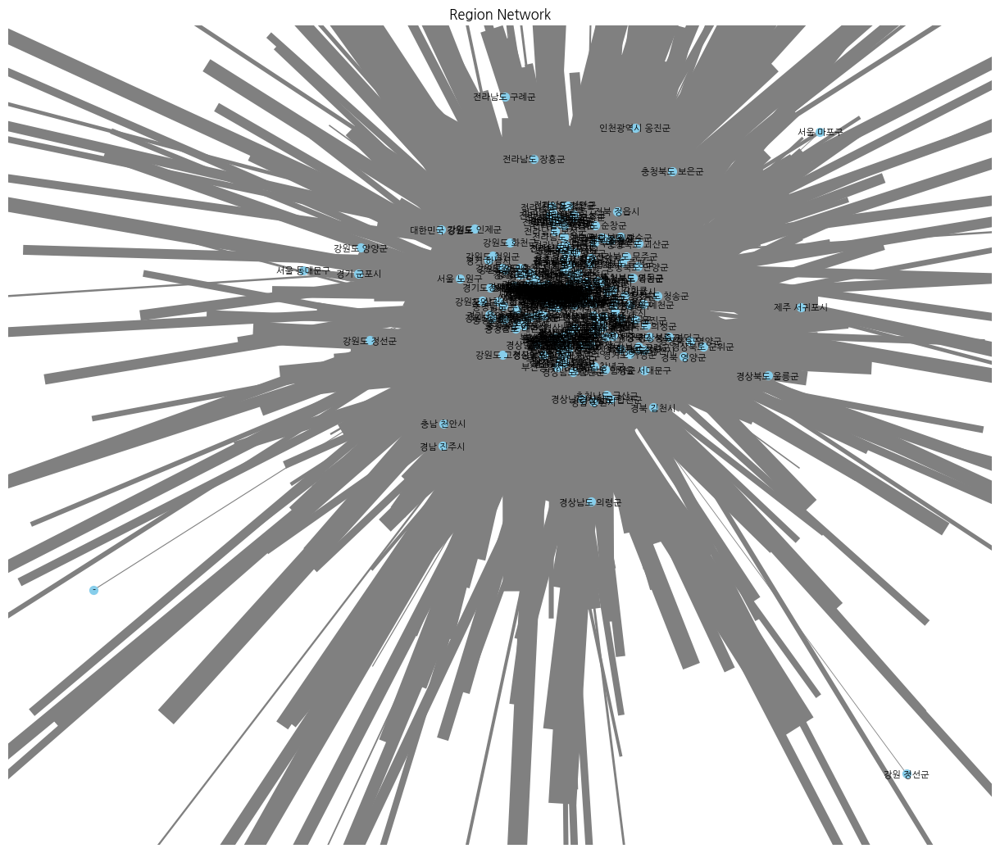

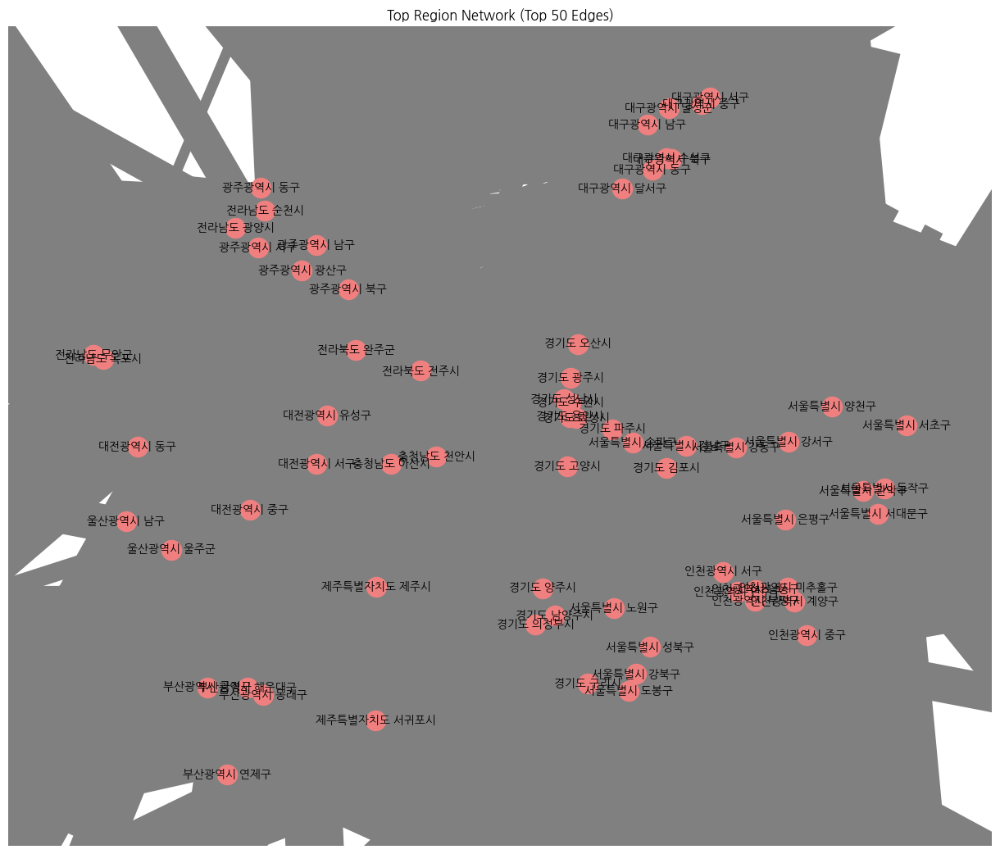

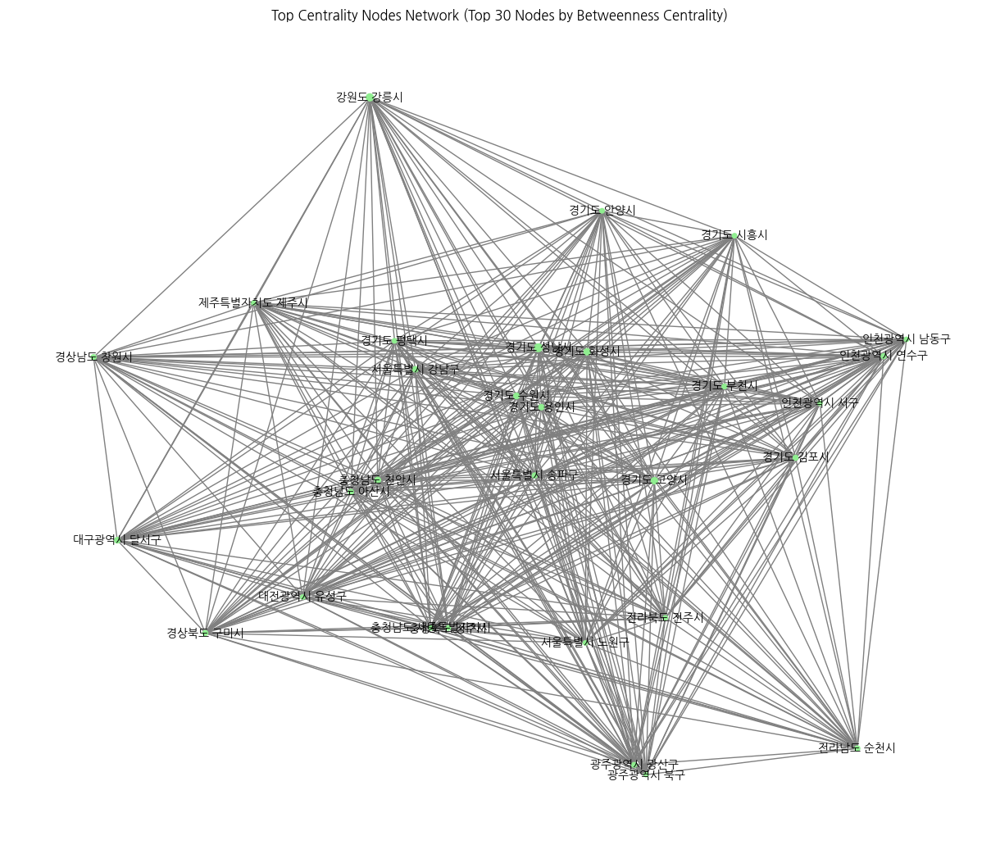

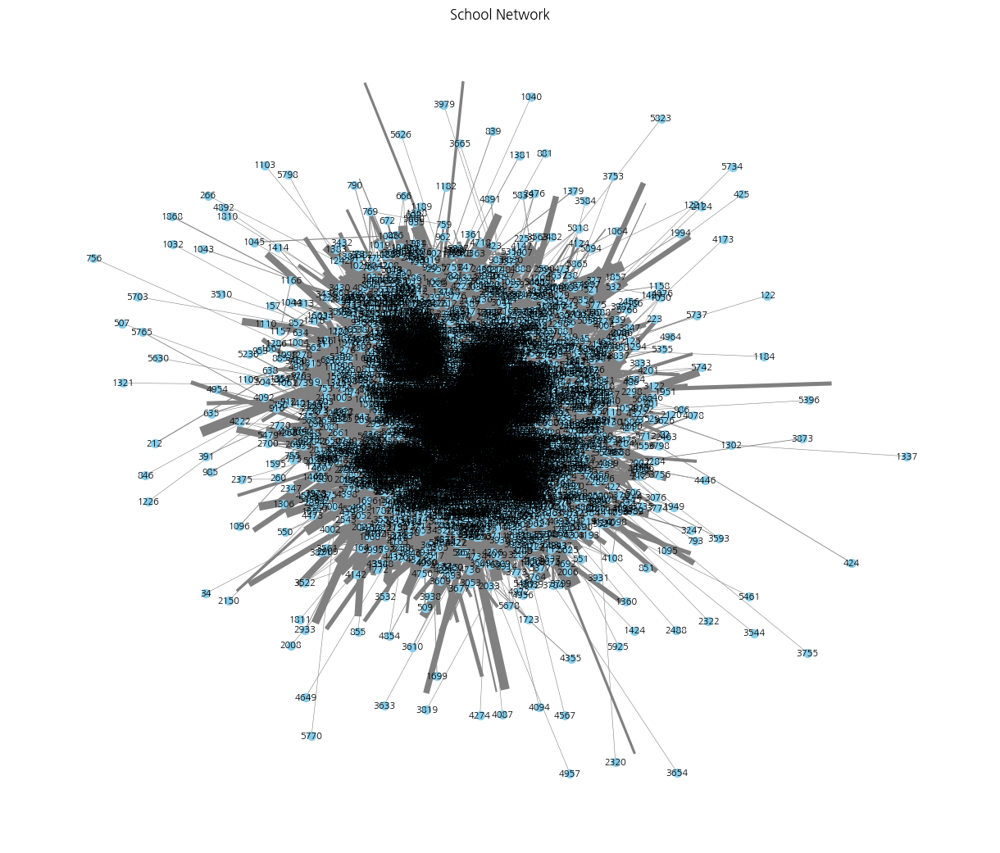

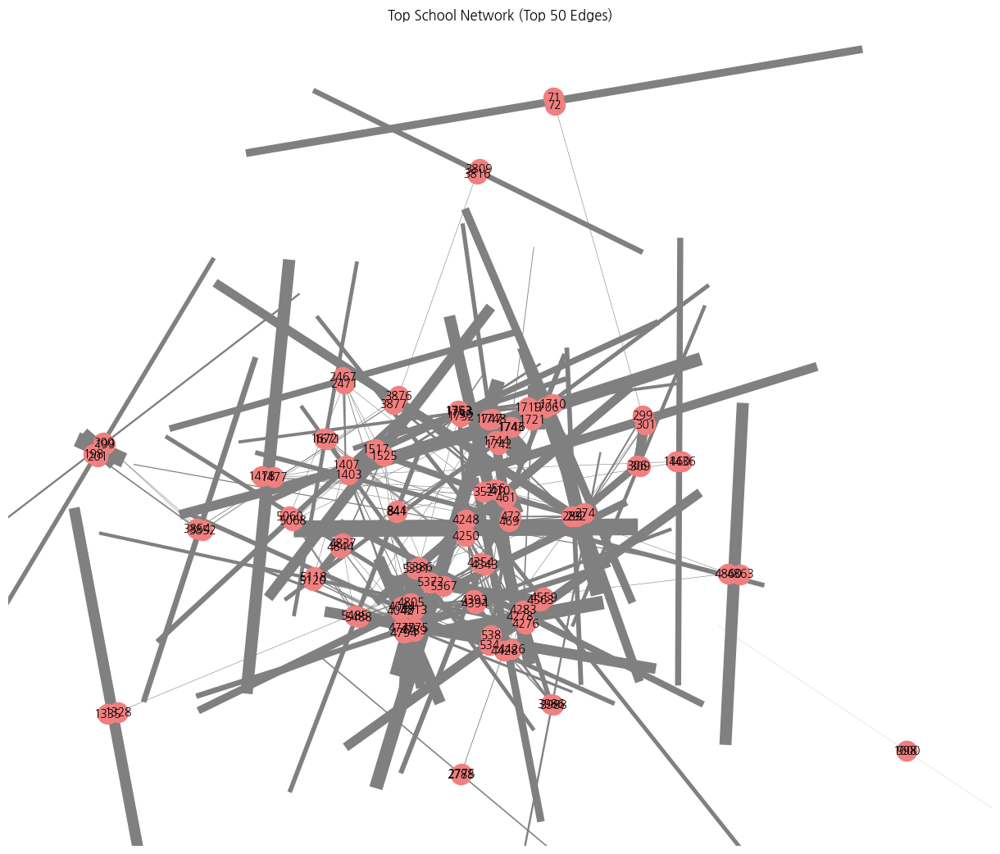

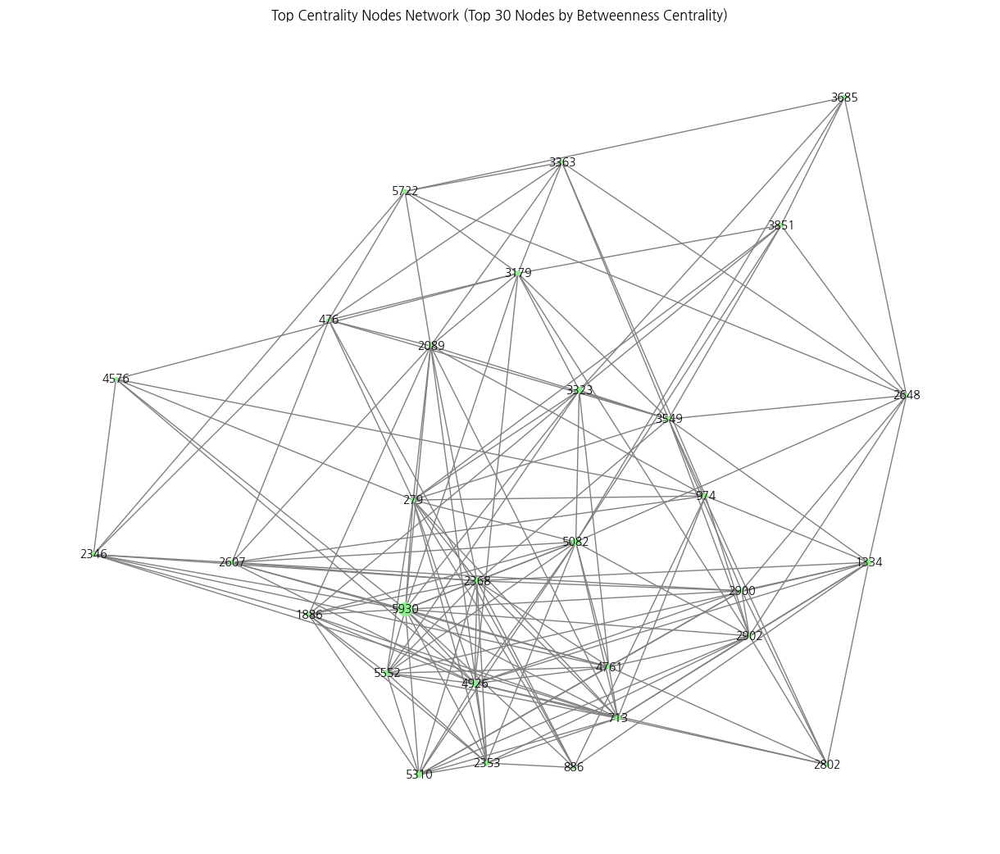

In [5]:
# 데이터프레임 user를 입력으로 사용
analyzer = SNSDiffusionAnalyzer(user)

# 네트워크 구축 및 저장
region_net = analyzer.build_region_network('/home/jovyan/work/data/region_network.pkl')
school_net = analyzer.build_school_network('/home/jovyan/work/data/school_network.pkl')

# 지역 네트워크 시각화
analyzer.visualize_network(region_net, title="Region Network", save_path="/home/jovyan/work/data/region_network_1.png")
# 상위 50개 엣지만 시각화
analyzer.visualize_top_edges(region_net, top_n=50, title="Top Region Network", save_path="/home/jovyan/work/data/region_network_2.png")
# 중심성이 높은 노드 중심 시각화
analyzer.visualize_top_nodes(region_net, top_n=30, centrality_type='betweenness', save_path="/home/jovyan/work/data/region_network_3.png")

# 학교 네트워크 시각화
analyzer.visualize_network(school_net, title="School Network", save_path="/home/jovyan/work/data/school_network_1.png")
# 상위 50개 엣지만 시각화
analyzer.visualize_top_edges(school_net, top_n=50, title="Top School Network", save_path="/home/jovyan/work/data/school_network_2.png")
# 중심성이 높은 노드 중심 시각화
analyzer.visualize_top_nodes(school_net, top_n=30, centrality_type='betweenness', save_path="/home/jovyan/work/data/school_network_3.png")

### 얇은 시각화 버전 (width=[w * 0.01 for w in weights])

[지역 네트워크] 노드 수: 249, 엣지 수: 15851
[학교 네트워크] 노드 수: 5347, 엣지 수: 197060


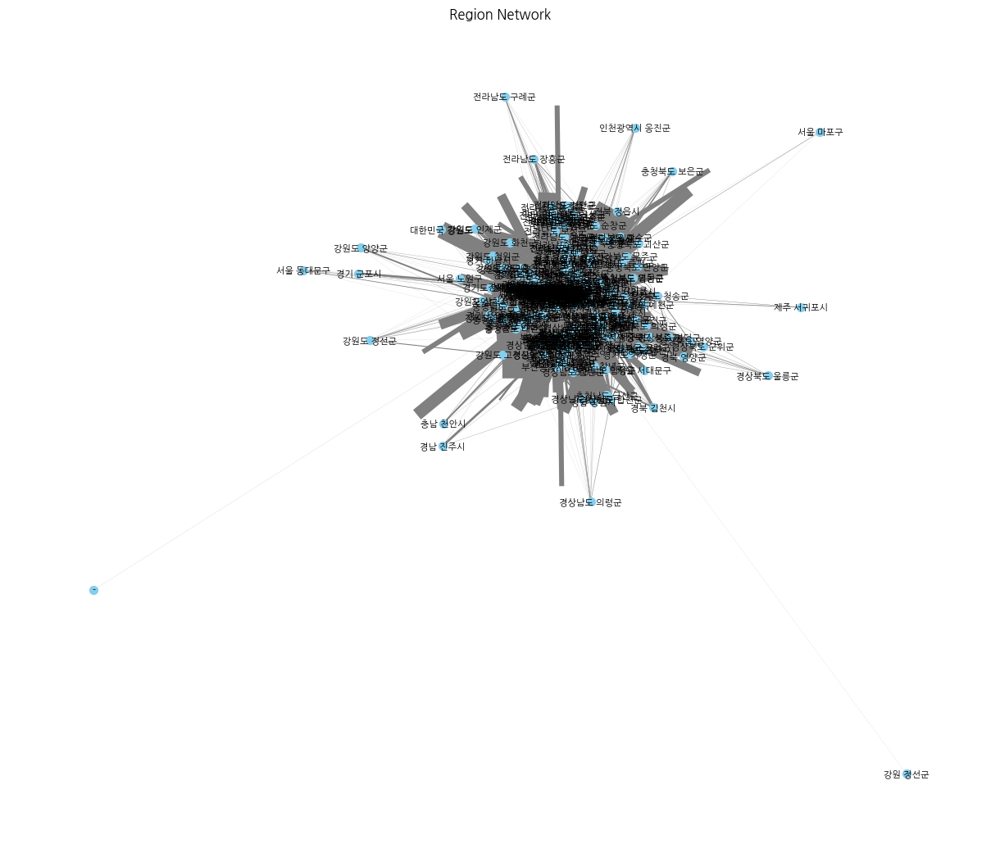

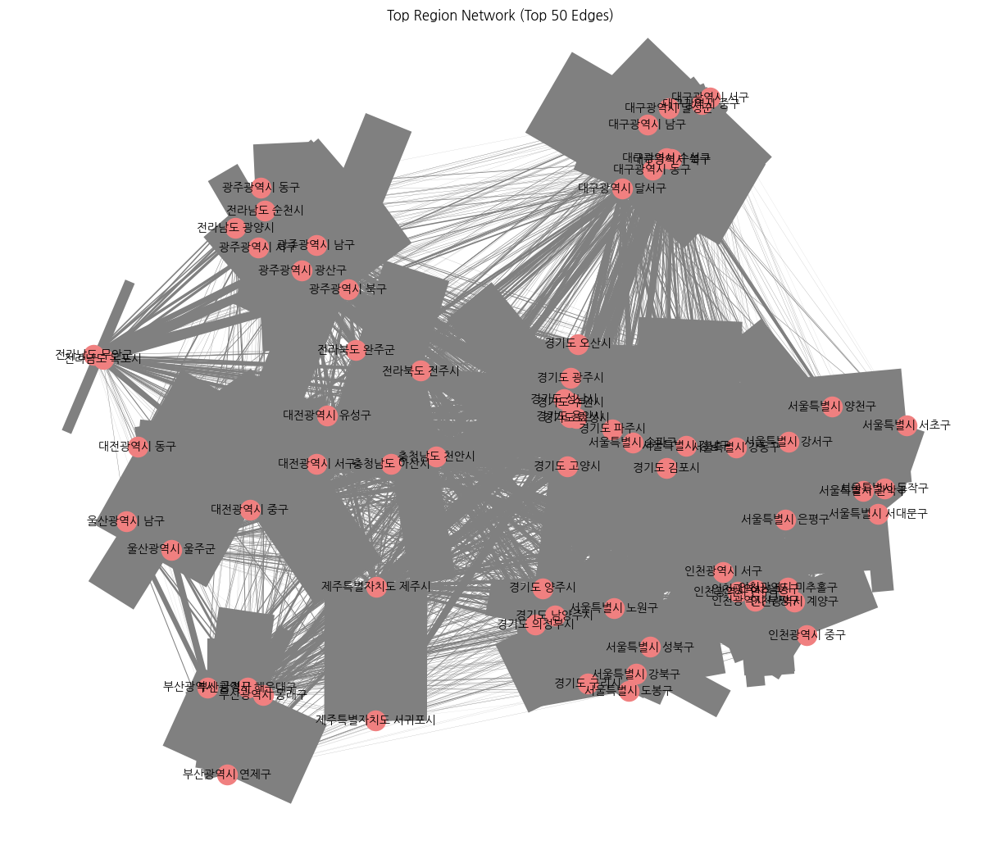

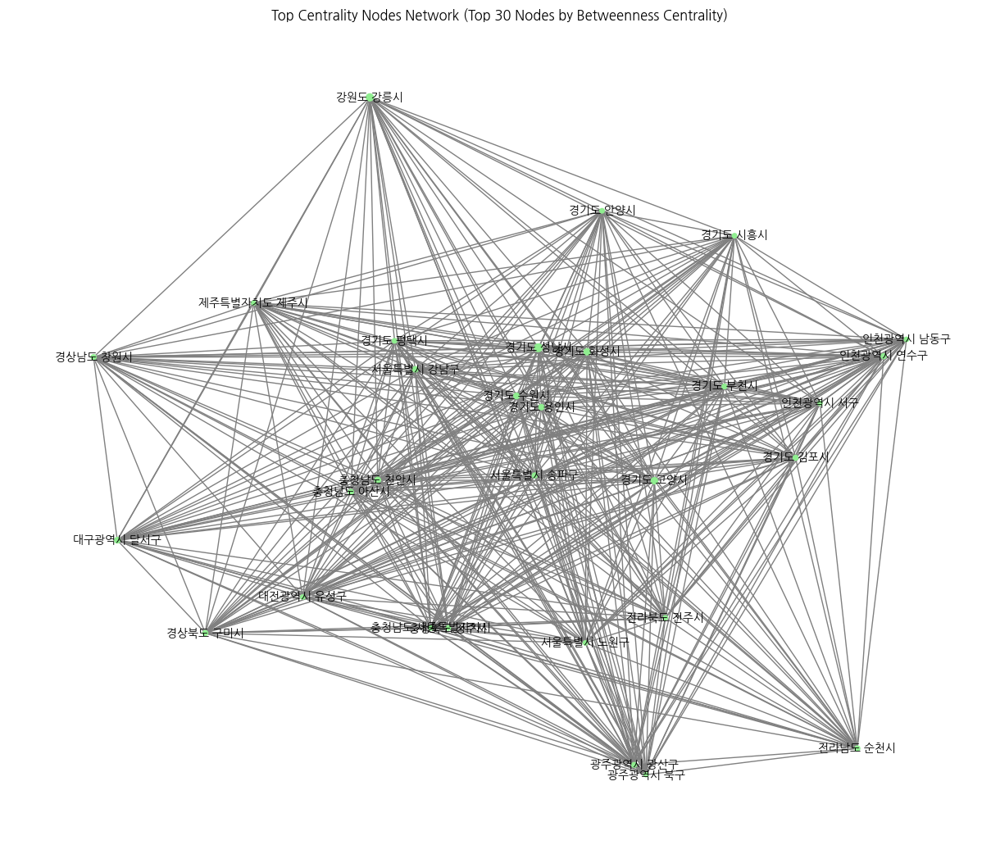

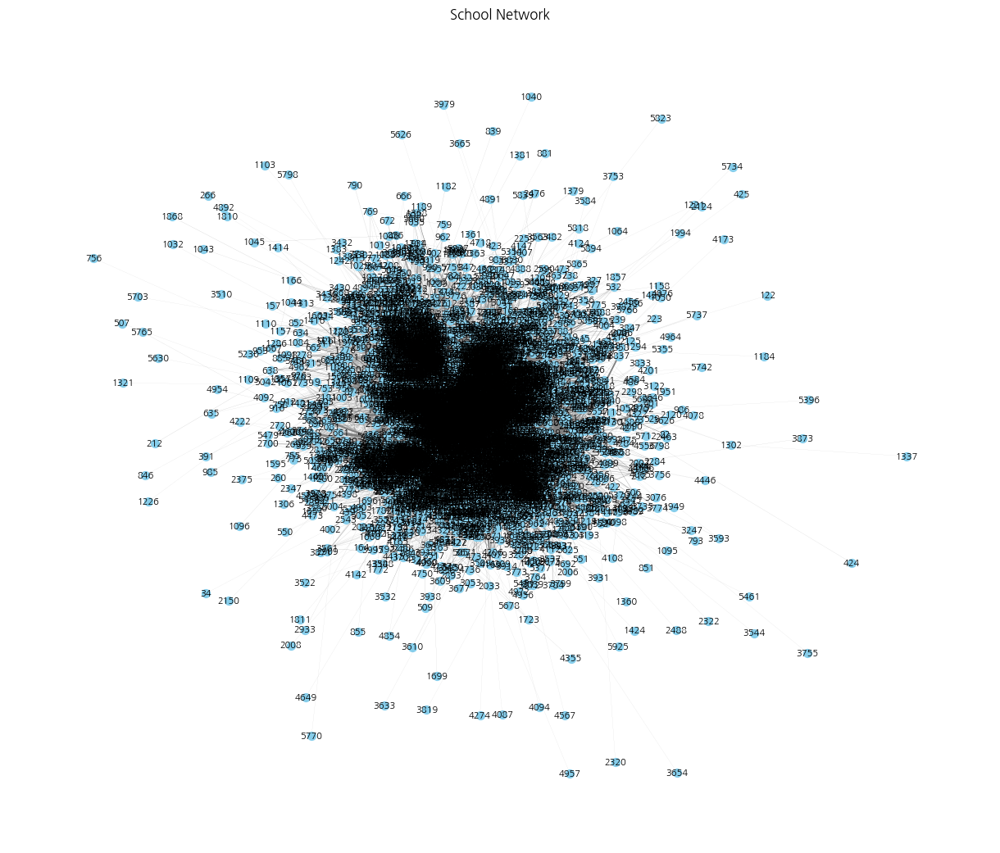

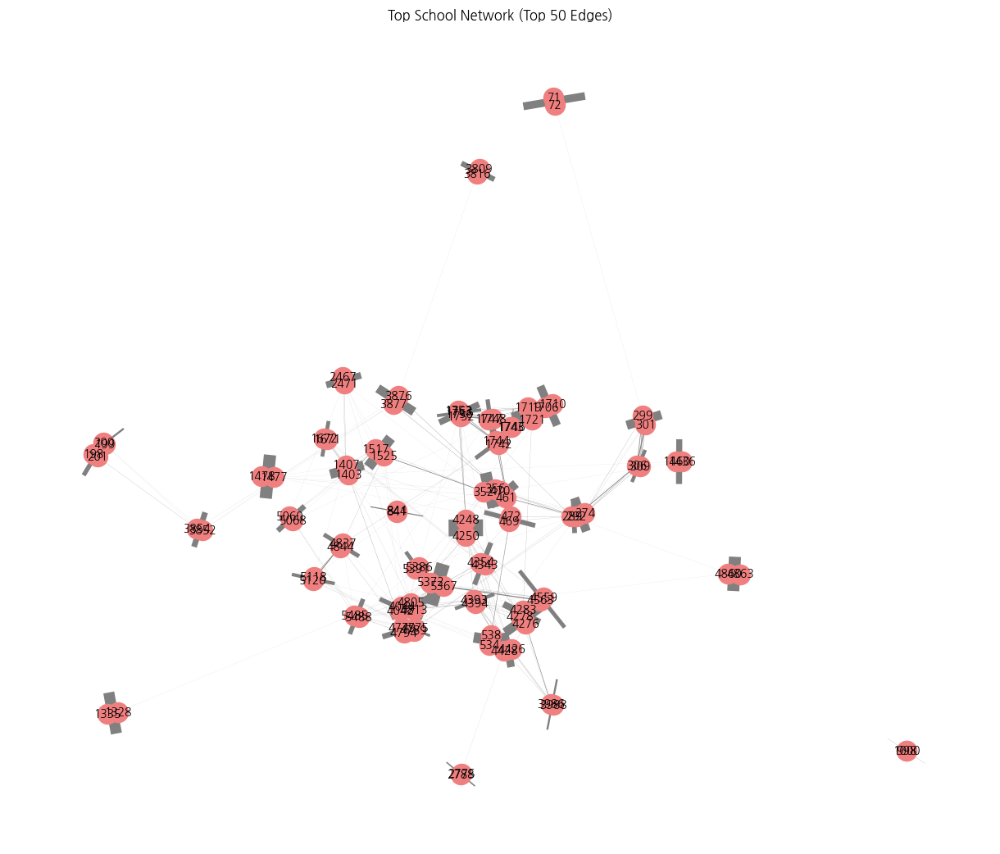

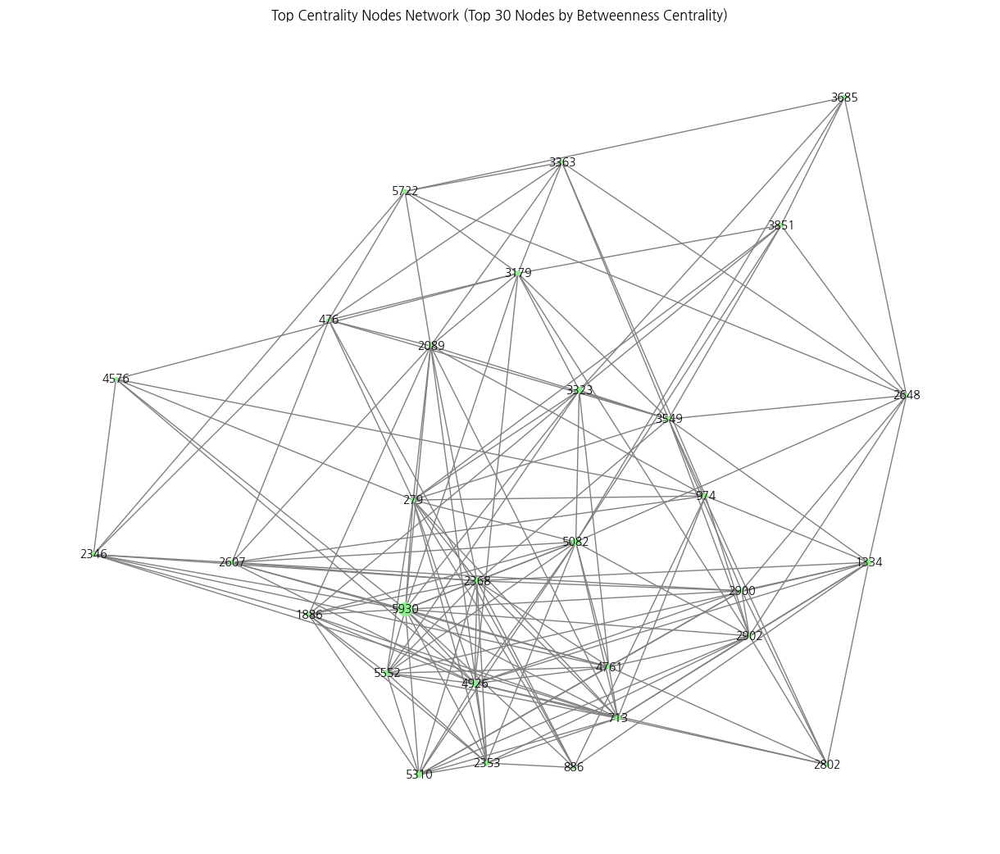

In [15]:
# 데이터프레임 user를 입력으로 사용
analyzer_2 = SNSDiffusionAnalyzer(user)

# 네트워크 구축 및 저장
region_net_2 = analyzer_2.build_region_network('/home/jovyan/work/data/region_network_2.pkl')
school_net_2 = analyzer_2.build_school_network('/home/jovyan/work/data/school_network_2.pkl')

# 지역 네트워크 시각화
analyzer_2.visualize_network(region_net_2, title="Region Network", save_path="/home/jovyan/work/data/region_network_1_2.png")
# 상위 50개 엣지만 시각화
analyzer_2.visualize_top_edges(region_net_2, top_n=50, title="Top Region Network", save_path="/home/jovyan/work/data/region_network_2_2.png")
# 중심성이 높은 노드 중심 시각화
analyzer_2.visualize_top_nodes(region_net_2, top_n=30, centrality_type='betweenness', save_path="/home/jovyan/work/data/region_network_3_2.png")

# 학교 네트워크 시각화
analyzer_2.visualize_network(school_net_2, title="School Network", save_path="/home/jovyan/work/data/school_network_1_2.png")
# 상위 50개 엣지만 시각화
analyzer_2.visualize_top_edges(school_net_2, top_n=50, title="Top School Network", save_path="/home/jovyan/work/data/school_network_2_2.png")
# 중심성이 높은 노드 중심 시각화
analyzer_2.visualize_top_nodes(school_net_2, top_n=30, centrality_type='betweenness', save_path="/home/jovyan/work/data/school_network_3_2.png")

## 학교 간 거리 및 확산 속도 시뮬레이션 (최적화 X)

In [ ]:
# 노드 정보 추출
node_df = user[['user_id', 'gender', 'group_id', 'grade', 'class_num', 'school_id', 'address', 'school_type']]

# friend_id_list 컬럼이 문자열인 경우, 리스트로 변환
user['friend_id_list'] = user['friend_id_list'].apply(eval)

# 에지 리스트 생성
edges = []
for _, row in user.iterrows():
    user_id = row['user_id']
    friends = row['friend_id_list']
    for friend_id in friends:
        # 양방향 중복 제거용: user_id < friend_id 순으로 정렬
        if user_id < friend_id:
            edges.append((user_id, friend_id))
        else:
            edges.append((friend_id, user_id))

# 중복 제거
edge_df = pd.DataFrame(list(set(edges)), columns=['user_id1', 'user_id2'])

# 1. 네트워크 생성
G = nx.from_pandas_edgelist(edge_df, 'user_id1', 'user_id2')

# 2. 학교 정보 병합
school_dict = dict(zip(node_df['user_id'], node_df['school_id']))
nx.set_node_attributes(G, school_dict, "school_id")

# 3. 확산 시뮬레이션
def simulate_si_spread(G, initial_user, max_steps=10):
    infected = set([initial_user])
    newly_infected = set([initial_user])
    history = [newly_infected.copy()]
    
    for step in range(max_steps):
        next_infected = set()
        for node in newly_infected:
            neighbors = G.neighbors(node)
            for n in neighbors:
                if n not in infected:
                    next_infected.add(n)
        if not next_infected:
            break
        infected.update(next_infected)
        newly_infected = next_infected
        history.append(newly_infected.copy())
    
    return history

# 4. 학교 단위 확산 시각화
def plot_school_spread(history, G):
    step_school_counts = []
    for step, infected in enumerate(history):
        school_counter = defaultdict(int)
        for node in infected:
            school_id = G.nodes[node].get('school_id', 'Unknown')
            school_counter[school_id] += 1
        step_school_counts.append(school_counter)

    # 변환 및 시각화
    df = pd.DataFrame(step_school_counts).fillna(0).astype(int)
    df.index.name = "Time Step"
    df.plot(kind='bar', stacked=True, figsize=(12,6))
    plt.ylabel("Infected User Count")
    plt.title("School-wise Spread Over Time")
    plt.legend(title="School ID", bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()

# 5. 실행 예시
initial_user = random.choice(list(G.nodes))  # 또는 특정 학교의 대표 유저
history = simulate_si_spread(G, initial_user)
plot_school_spread(history, G)

## 학교 간 거리 및 확산 속도 시뮬레이션 (최적화 O)

In [4]:
# 노드 정보 추출
node_df = user[['user_id', 'gender', 'group_id', 'grade', 'class_num', 'school_id', 'address', 'school_type']]

# 에지 리스트 생성
edges = []
for _, row in user.iterrows():
    user_id = row['user_id']
    friends = row['friend_id_list']
    for friend_id in friends:
        # 양방향 중복 제거용: user_id < friend_id 순으로 정렬
        if user_id < friend_id:
            edges.append((user_id, friend_id))
        else:
            edges.append((friend_id, user_id))

# 중복 제거
edge_df = pd.DataFrame(list(set(edges)), columns=['user_id1', 'user_id2'])

# 네트워크 생성
G = nx.from_pandas_edgelist(edge_df, 'user_id1', 'user_id2')

# user_id를 key로 하고, dict(row) 형태의 value를 가지는 dict 생성
node_attr_dict = node_df.set_index('user_id').to_dict(orient='index')
nx.set_node_attributes(G, node_attr_dict)

In [8]:
with open("/home/jovyan/work/data/G.pkl", "wb") as f:
    pickle.dump(G, f)

In [5]:
def run_diffusion_simulation_top_schools_safe(G, top_n=20, cutoff=10):
    # 1. degree centrality 계산
    degree_centrality = nx.degree_centrality(G)

    # 2. school별 중심성 평균 계산
    school_centrality = {}
    for node, centrality in degree_centrality.items():
        school_id = G.nodes[node].get('school_id')
        if school_id is not None:
            school_centrality.setdefault(school_id, []).append(centrality)

    avg_school_centrality = {
        school: sum(vals) / len(vals)
        for school, vals in school_centrality.items()
    }

    # 3. 중심성 상위 N개 학교 추출
    top_schools = sorted(avg_school_centrality, key=avg_school_centrality.get, reverse=True)[:top_n]

    # 4. 학교별 노드 캐싱
    school_node_map = {
        school: [n for n in G.nodes if G.nodes[n].get('school_id') == school]
        for school in top_schools
    }

    results = []

    # 5. source_school마다 BFS 수행
    for source_school in top_schools:
        source_nodes = school_node_map[source_school]
        if not source_nodes:
            continue

        # 해당 source_school의 노드 하나하나에 대해 거리 계산
        # 결과는 합쳐서 관리
        combined_lengths = {}
        for s in source_nodes:
            try:
                lengths = nx.single_source_shortest_path_length(G, s, cutoff=cutoff)
                for node, dist in lengths.items():
                    if node not in combined_lengths or dist < combined_lengths[node]:
                        combined_lengths[node] = dist
            except Exception:
                continue

        for target_school in top_schools:
            if source_school == target_school:
                continue

            target_nodes = school_node_map[target_school]
            reachable_targets = set(target_nodes).intersection(combined_lengths.keys())
            if reachable_targets:
                min_dist = min(combined_lengths[t] for t in reachable_targets)
                results.append({
                    'source_school': source_school,
                    'target_school': target_school,
                    'min_steps': min_dist
                })

    return pd.DataFrame(results)

In [6]:
df_result = run_diffusion_simulation_top_schools_safe(G, top_n=20, cutoff=10)
df_result.head()

,source_school,target_school,min_steps
0,1389,1373,2
1,1389,737,2
2,1389,1726,2
3,1389,1942,2
4,1389,3788,2


In [15]:
df_result.to_csv('/home/jovyan/work/data/diffusion_simulation_top20_cutoff10.csv', index=False)

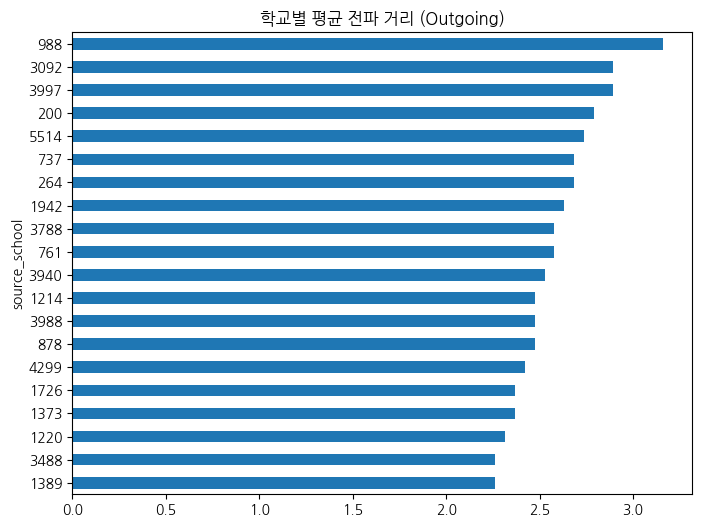

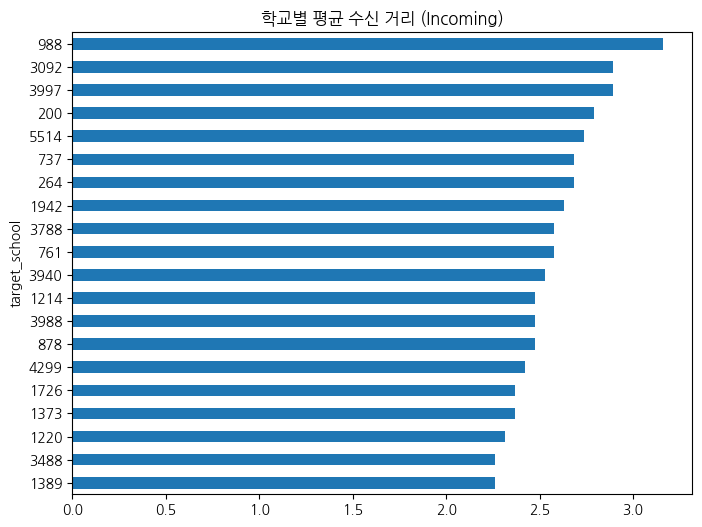

In [11]:
avg_outgoing = df_result.groupby('source_school')['min_steps'].mean().sort_values()
avg_outgoing.plot(kind='barh', title='학교별 평균 전파 거리 (Outgoing)', figsize=(8, 6))

plt.show()

avg_incoming = df_result.groupby('target_school')['min_steps'].mean().sort_values()
avg_incoming.plot(kind='barh', title='학교별 평균 수신 거리 (Incoming)', figsize=(8, 6))

plt.show()

어차피 그냥 쌍 만든거라 outgoing이랑 incoming 그래프 같음

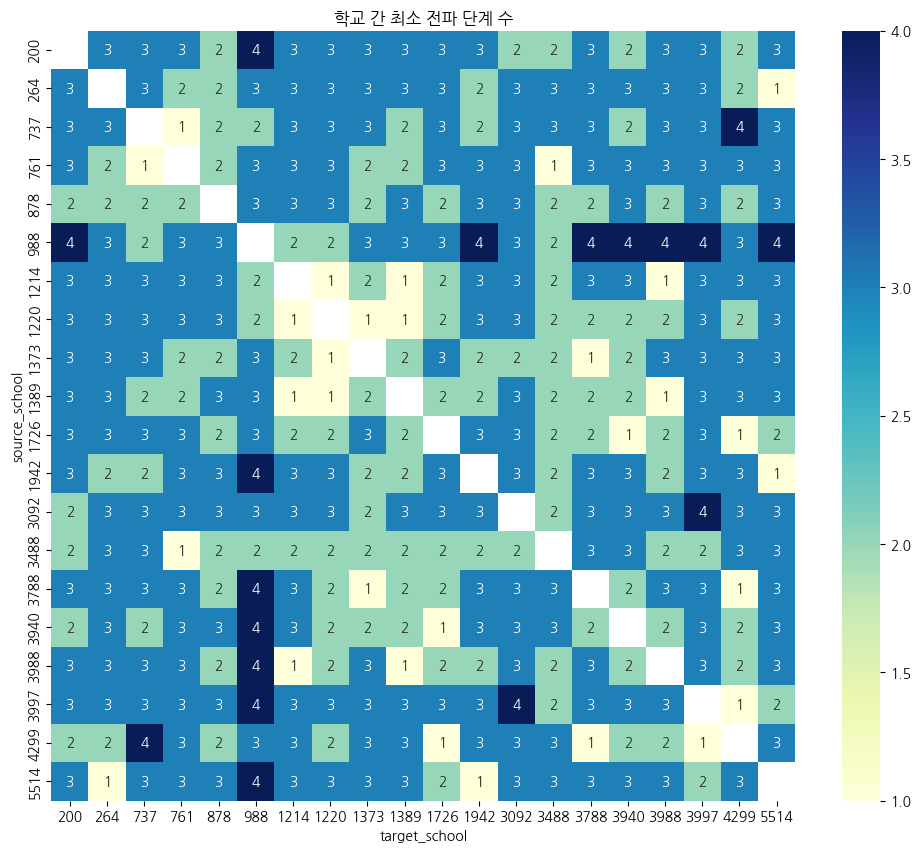

In [12]:
pivot_table = df_result.pivot(index='source_school', columns='target_school', values='min_steps')

plt.figure(figsize=(12,10))
sns.heatmap(pivot_table, annot=True, fmt=".0f", cmap="YlGnBu")
plt.title('학교 간 최소 전파 단계 수')
plt.show()

이거 숫자 작은 학교들간에 실제 지리적 근접성이 있는지 호재가 따온 위경도 지표로 보면 좋을듯?

----

## 데이터 로드 (여기부터 실행)

In [ ]:
# 데이터셋 로드 (merged_df, user)
merged_df = pd.read_csv('/home/jovyan/work/data/merged_df.csv', encoding='UTF-8')
user = pd.read_csv('/home/jovyan/work/data/user.csv', encoding='UTF-8')

# 구축된 네트워크 로드 (pkl 파일)
with open("/home/jovyan/work/data/G.pkl", "rb") as f:
    G = pickle.load(f)

with open('/home/jovyan/work/data/region_network.pkl', 'rb') as file:
    region_net = pickle.load(file)

with open('/home/jovyan/work/data/school_network.pkl', 'rb') as file:
    school_net = pickle.load(file)

# iGraph로 변환된 네트워크 로드 (graphml 파일)
ig_graph = ig.Graph.Read_GraphML('/home/jovyan/work/data/graph.graphml')

## 브리지 유저 식별 (중심성 기반)

### 중심성 계산 (최적화 X)

- networkX로 바로 Betweenness Centrality 계산 (nx.betweenness_centrality(G)) -> 커널 다운
- iGraph로 변환해서 Betweenness 계산 (ig.Graph.TupleList(G.edges(), directed=False).betweenness()) -> 커널 다운

In [3]:
print("그래프 크기 (노드 수, 엣지 수):", G.order(), G.size())

그래프 크기 (노드 수, 엣지 수): 677037 18144551


### 중심성 계산

NetworkX → iGraph 변환

In [ ]:
nx_graph_path = "/home/jovyan/work/data/ig_graph.graphml"

if not os.path.exists(nx_graph_path):
    print("Converting NetworkX → iGraph and saving...")

    # # 네트워크 엣지 리스트를 기반으로 networkx 그래프 만들기 
    # G = nx.from_pandas_edgelist(edge_df, 'user_id1', 'user_id2')

    # 노드 이름 string으로 맞추기
    G = nx.convert_node_labels_to_integers(G, label_attribute='name')

    # networkx → iGraph
    ig_graph = ig.Graph.TupleList(G.edges(), directed=False)
    node_names = [d["name"] for n, d in G.nodes(data=True)]
    ig_graph.vs["name"] = node_names

    # 저장 (GraphML)
    ig_graph.write_graphml(nx_graph_path)
    print(f"Saved iGraph to {nx_graph_path}")

else:
    print(f"Loading iGraph from {nx_graph_path}...")
    ig_graph = ig.Graph.Read_GraphML(nx_graph_path)

NetworkX → NetworKit 변환

In [9]:
# === 0. G.pkl 불러오기 ===
print("Loading NetworkX", flush=True)
with open("/home/jovyan/work/data/G.pkl", "rb") as f:
    G_nx = pickle.load(f)

print("Converting NetworkX to NetworKit", flush=True)

# 노드 ID를 0부터 시작하는 연속된 정수로 매핑
node_list = list(G_nx.nodes())
node_map = {node: i for i, node in enumerate(node_list)}

# NetworKit 그래프 생성
G_nk = nk.Graph(n=len(node_list), weighted=False, directed=False)

# 간선 추가 (매핑된 정수 ID 사용)
for u, v in G_nx.edges():
    G_nk.addEdge(node_map[u], node_map[v])

print("NetworKit Prepared", flush=True)

nk.graphio.writeGraph(G_nk, "/home/jovyan/work/data/G_nk.graph", nk.Format.METIS)
print("NetworKit Saved", flush=True)

Loading NetworkX
Converting NetworkX to NetworKit
NetworKit Prepared


1. PageRank 상위 노드
   - 네트워크 흐름 기반 영향력 있는 노드 선정
   - Social network 분석 등에서 효과적
2. Community 중심 노드
   - Louvain, Leiden 등으로 커뮤니티 탐지 → 각 커뮤니티 대표 노드 선택
   - 정보 확산, 구조적 중심성 평가에 유리

### 여기서부터 실행 (불러오기)

In [3]:
# === 0. ig_graph.graphml 불러오기 ===
print(f"Loading iGraph", flush=True)
ig_graph = ig.Graph.Read_GraphML('/home/jovyan/work/data/ig_graph.graphml')
print(f"iGraph Loaded", flush=True)

Loading iGraph
iGraph Loaded


In [4]:
# === 0. G_nk.graph 불러오기 ===
print(f"Loading NetworKit", flush=True)
G_nk = nk.graphio.readGraph("/home/jovyan/work/data/G_nk.graph", nk.Format.METIS)
print(f"NetworKit Loaded", flush=True)

Loading NetworKit
NetworKit Loaded


In [5]:
# === 1. PageRank 상위 노드 선정 ===
print("Calculating PageRank with iGraph", flush=True)

pagerank_scores = ig_graph.pagerank()
top_n = 500
top_pr_indices = sorted(range(len(pagerank_scores)),
                        key=lambda i: pagerank_scores[i],
                        reverse=True)[:top_n]

Calculating PageRank with iGraph


In [6]:
# === 2. Leiden Community 구축 === (Louvain는 너무 오래 걸려서 버림)
print("Detecting Leiden communities with iGraph", flush=True)
partition = leidenalg.find_partition(ig_graph, leidenalg.ModularityVertexPartition)
membership = partition.membership
community_series = pd.Series(membership, index=ig_graph.vs['name'])

# 이름 → 인덱스 매핑
print("Mapping Name to Index")
name_to_index = {name: idx for idx, name in enumerate(ig_graph.vs["name"])}

# 커뮤니티별 노드 이름 모으기
print("Collectiing Community Node Name")
community_members = defaultdict(list)
for name, cid in community_series.items():
    community_members[cid].append(name)
    
print("Leiden communities Detected")

Detecting Leiden communities with iGraph
Mapping Name to Index
Collectiing Community Node Name
Leiden communities Detected


In [7]:
# === 3. Leiden Community 중심 노드 선정 ===
print("Finding Central Nodes", flush=True)

central_nodes = []
for community_id, member_names in community_members.items():
    member_indices = [name_to_index[n] for n in member_names if n in name_to_index]
    subgraph = ig_graph.subgraph(member_indices)
    if len(subgraph.vs) == 0:
        continue
    degrees = subgraph.degree()
    if not degrees:
        continue
    max_idx = degrees.index(max(degrees))
    center_node_name = subgraph.vs[max_idx]["name"]
    if center_node_name in name_to_index:
        central_nodes.append(center_node_name)

community_indices = [name_to_index[n] for n in central_nodes]

print("Found Central Nodes")

Finding Central Nodes
Found Central Nodes


In [ ]:
# === 4. Betweenness 계산 (근사, cutoff 사용) ===
# print("Calculating Betweenness for PageRank-based nodes", flush=True)
# bc_pr = ig_graph.betweenness(vertices=top_pr_indices[:100], cutoff=8, directed=False)


# print("Calculating Betweenness for Community-based nodes", flush=True)
# bc_comm = ig_graph.betweenness(vertices=community_indices, cutoff=8, directed=False)

# print("Betweenness Calculated")

In [8]:
# === 4. Betweenness 계산 (최적화 버전) ===
print("Calculating Betweenness for Every nodes", flush=True)
start = time.time()
bca = nk.centrality.ApproxBetweenness(G_nk, epsilon=0.1, delta=0.2)
bca.run()
end = time.time()
print(f"Done in {end - start:.2f} seconds", flush=True)

bc_vals = bca.scores() # list of betweenness scores

print("Filtering PageRank-based nodes", flush=True)
bc_pr = [bc_vals[v] for v in top_pr_indices]

print("Filtering Community-based nodes", flush=True)
bc_comm = [bc_vals[v] for v in community_indices]

print("Betweenness Calculated")

Calculating Betweenness for Every nodes
Done in 162.88 seconds
Filtering PageRank-based nodes
Filtering Community-based nodes
Betweenness Calculated


In [9]:
# === 5. 결과 저장 ===
print("Saving Result", flush=True)

pr_df = pd.DataFrame({
    "node": [ig_graph.vs[i]["name"] for i in top_pr_indices],
    "method": "pagerank",
    "betweenness": bc_pr
})

comm_df = pd.DataFrame({
    "node": [ig_graph.vs[i]["name"] for i in community_indices],
    "method": "community",
    "betweenness": bc_comm
})

result_df = pd.concat([pr_df, comm_df], ignore_index=True)
result_df.to_csv("/home/jovyan/work/data/central_nodes_betweenness.csv", index=False)

print("Result Saved: central_nodes_betweenness.csv")

Saving Result
Result Saved: central_nodes_betweenness.csv


In [12]:
top_pr = pr_df.sort_values(by="betweenness", ascending=False).head(10)
top_comm = comm_df.sort_values(by="betweenness", ascending=False).head(10)
print("Top PR nodes:\n", top_pr)
print("Top Community nodes:\n", top_comm)

Top PR nodes:
           node    method  betweenness
0    1154758.0  pagerank          0.0
329  1443284.0  pagerank          0.0
342   927061.0  pagerank          0.0
341   943360.0  pagerank          0.0
340  1206351.0  pagerank          0.0
339  1366052.0  pagerank          0.0
338   924290.0  pagerank          0.0
337  1238973.0  pagerank          0.0
336  1043947.0  pagerank          0.0
335  1241315.0  pagerank          0.0
Top Community nodes:
           node     method  betweenness
0    1162155.0  community          0.0
104  1343096.0  community          0.0
97    953480.0  community          0.0
98    840012.0  community          0.0
99   1155994.0  community          0.0
100  1534131.0  community          0.0
101  1299811.0  community          0.0
102   982021.0  community          0.0
103  1578322.0  community          0.0
105   847937.0  community          0.0


### ApproxBetweenness와 PageRank Centrality 계산

In [4]:
# 데이터셋 로드 (user)
user = pd.read_csv('/home/jovyan/work/data/user.csv', encoding='UTF-8')

In [18]:
# --- 네트워크 중심성 계산 ---
# 1. Betweenness from NetworKit
# bca = nk.centrality.ApproxBetweenness(G_nk, epsilon=0.1, delta=0.2)
# bca.run()
# bc_vals = bca.scores()

# 2. PageRank from iGraph
print("Calculating PageRank Score", flush=True)
pagerank_scores = ig_graph.pagerank()
print("PageRank Score Calculated", flush=True)

Calculating PageRank Score
PageRank Score Calculated


In [20]:
# 3. Degree Centrality (공통 기반)
print("Calculating Degree Centrality", flush=True)
degree_dict = {node: G_nk.degree(node) for node in G_nk.iterNodes()}
degree_vals = [G_nk.degree(node) for node in range(G_nk.numberOfNodes())]
print("Degree Centrality Calculated", flush=True)

Calculating Degree Centrality
Degree Centrality Calculated


In [44]:
# --- 중심성 통합 DataFrame ---
user_ids = np.array(ig_graph.vs["name"]).astype(int)

df_clustering = pd.DataFrame({
    "user_id": user_ids,
    "betweenness": bc_vals,
    "pagerank": pagerank_scores,
    "degree": degree_vals
})

In [46]:
# 유저 메타데이터와 병합 (예: 학년, 지역, 학교명, 친구 수 등)
df_clustering = df_clustering.merge(user, on="user_id", how="left")
df_clustering.to_csv("/home/jovyan/work/data/df_clustering.csv", index=False)
print("df_clustering Saved", flush=True)

df_clustering Saved


### 클러스터링 준비

In [9]:
user = pd.read_csv('/home/jovyan/work/data/user.csv', encoding='UTF-8')
df_clustering = pd.read_csv("/home/jovyan/work/data/df_clustering.csv", encoding="UTF-8")

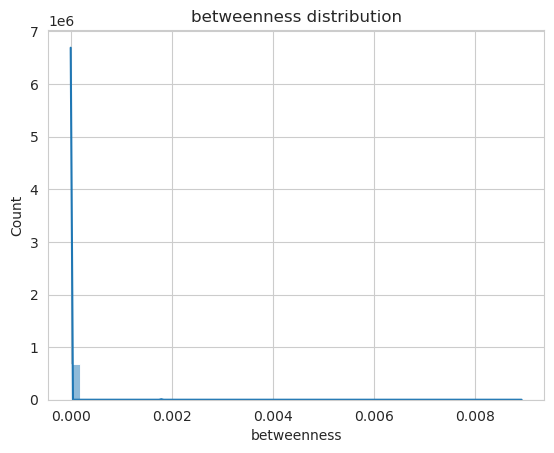

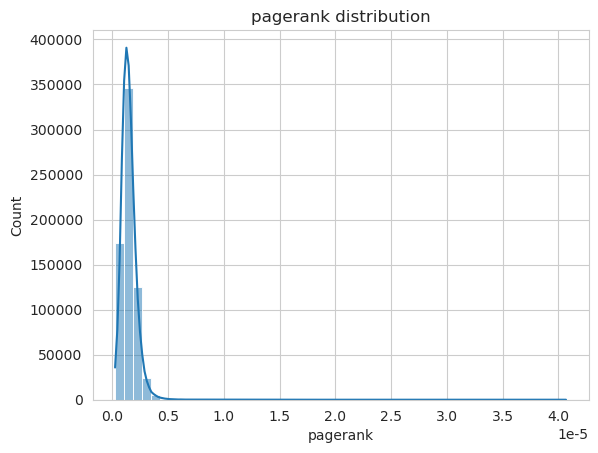

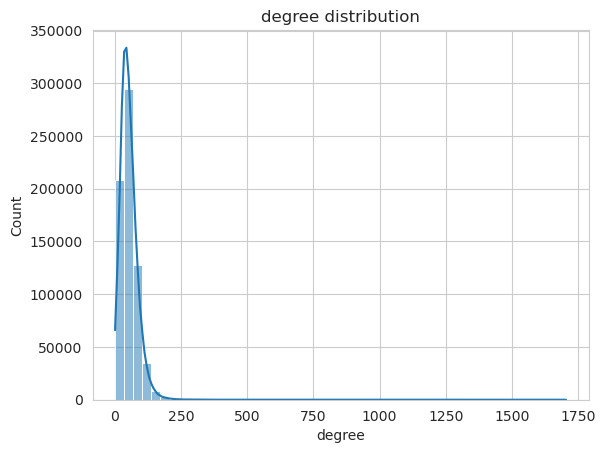

In [ ]:
for col in ["betweenness", "pagerank", "degree"]:
    sns.histplot(df_clustering[col], bins=50, kde=True)
    plt.title(f"{col} distribution")
    plt.show() 

In [25]:
df_clustering["log_betweenness"] = np.log1p(df_clustering["betweenness"])
df_clustering["log_pagerank"] = np.log1p(df_clustering["pagerank"])
df_clustering["log_degree"] = np.log1p(df_clustering["degree"])

In [26]:
features_log = ["log_betweenness", "log_pagerank", "log_degree"]
scaler = StandardScaler()
df_scaled = df_clustering.copy()
df_scaled[["scaled_betweenness", "scaled_pagerank", "scaled_degree"]] = scaler.fit_transform(df_clustering[features_log])

In [29]:
df_scaled.columns

Index(['user_id', 'betweenness', 'pagerank', 'degree', 'first_created_at',
       'last_created_at', 'first_created_at_table', 'last_created_at_table',
       'duration', 'gender', 'group_id', 'friend_id_list', 'friend_count',
       'id_x', 'grade', 'class_num', 'school_id', 'id_y', 'address',
       'student_count', 'school_type', 'user_cluster', 'log_betweenness',
       'log_pagerank', 'log_degree', 'scaled_betweenness', 'scaled_pagerank',
       'scaled_degree', 'cluster'],
      dtype='object')

In [27]:
df_scaled.to_csv("/home/jovyan/work/data/df_scaled.csv", index=False)

### 이상치 제거

In [32]:
from scipy.stats import zscore

# 이상치 제거용 z-score 필터링
z_scores = np.abs(zscore(df_scaled[["scaled_betweenness", "scaled_pagerank", "scaled_degree"]]))
df_no_outlier = df_scaled[(z_scores < 3).all(axis=1)]

### 클러스터링 k 선정

In [ ]:
features_scaled = ["scaled_betweenness", "scaled_pagerank", "scaled_degree"]

df_sampled = df_scaled.sample(n=1000, random_state=42)
for k in range(2, 10):
    kmeans = KMeans(n_clusters=k, random_state=42)
    labels = kmeans.fit_predict(df_sampled[features_scaled])
    score = silhouette_score(df_sampled[features_scaled], labels)
    print(f"k={k}, silhouette score = {score:.4f}")

- k=2, silhouette score = 0.9023
- k=3, silhouette score = 0.3413
- k=4, silhouette score = 0.3796
- k=5, silhouette score = 0.3381
- k=6, silhouette score = 0.3398
- k=7, silhouette score = 0.3369
- k=8, silhouette score = 0.3320
- k=9, silhouette score = 0.3310

### 클러스터링 (k=2)

In [ ]:
# df_scaled = pd.read_csv("/home/jovyan/work/data/df_scaled.csv", encoding="UTF-8")

In [ ]:
reducer = umap.UMAP(random_state=42)
X_umap = reducer.fit_transform(df_no_outlier[["scaled_betweenness", "scaled_pagerank", "scaled_degree"]])

df_no_outlier["UMAP1"] = X_umap[:, 0]
df_no_outlier["UMAP2"] = X_umap[:, 1]

sns.scatterplot(data=df_no_outlier, x="UMAP1", y="UMAP2", hue="cluster", palette="tab10", alpha=0.7)
plt.title("KMeans Clustering (UMAP after log+scaling + outlier removal)")
plt.grid(True)
plt.show()

/opt/conda/lib/python3.11/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


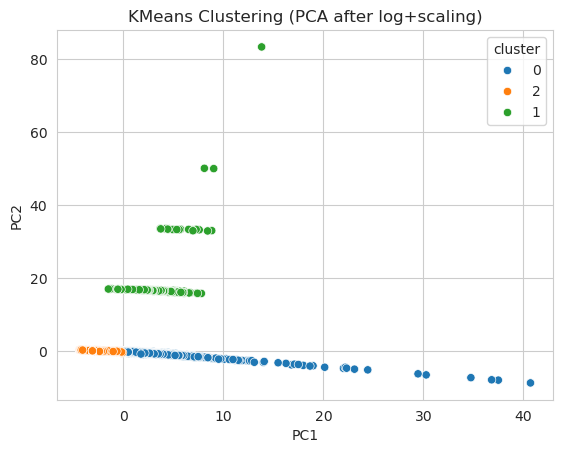

In [30]:
# PCA 시각화
pca = PCA(n_components=2)
X_pca = pca.fit_transform(df_scaled[features_scaled])

plot_df = pd.DataFrame({
    "PC1": X_pca[:, 0],
    "PC2": X_pca[:, 1],
    "cluster": df_scaled["cluster"].astype(str)
})

sns.scatterplot(data=plot_df, x="PC1", y="PC2", hue="cluster", palette="tab10")
plt.title("KMeans Clustering (PCA after log+scaling)")
plt.grid(True)
plt.show()

### Feature Importance 분석

In [ ]:
# --- Feature Importance 분석 (클러스터 0 vs 나머지) ---
df_clustering["target"] = (df_clustering["user_cluster"] == 0).astype(int)
feature_cols = ["betweenness", "pagerank", "degree", "duration", "friend_count"]

# 범주형 변수 처리
df_model = pd.get_dummies(df_clustering[feature_cols + ["target"]], drop_first=True)

X = df_model.drop("target", axis=1)
y = df_model["target"]

In [ ]:
# RandomForest Classifier
model = RandomForestClassifier(n_estimators=100, random_state=42)
model.fit(X, y)

importances = pd.Series(model.feature_importances_, index=X.columns).sort_values(ascending=False)
print(importances.head(10))

## 학교 간 네트워크 거리 계산

In [ ]:
# 평균적으로 특정 학교 유저들이 다른 학교 유저들과 얼마나 가까운지 측정
from itertools import combinations

def compute_school_distances(G):
    schools = node_df['school_id'].unique()
    school_user_map = node_df.groupby('school_id')['user_id'].apply(list).to_dict()
    
    school_distance = {}
    for s1, s2 in combinations(schools, 2):
        users1 = school_user_map[s1]
        users2 = school_user_map[s2]
        distances = []
        for u1 in users1:
            for u2 in users2:
                if nx.has_path(G, u1, u2):
                    distances.append(nx.shortest_path_length(G, u1, u2))
        if distances:
            avg_dist = sum(distances) / len(distances)
            school_distance[(s1, s2)] = avg_dist
    return school_distance

school_dist = compute_school_distances(G)
print("\nSchool Pairwise Average Distances (shortest paths):")
for pair, dist in sorted(school_dist.items(), key=lambda x: x[1]):
    print(f"{pair[0]} <-> {pair[1]}: {dist:.2f}")

## 본격 분석 - 학교 네트워크

### 0. Preparing Network

#### 학교 네트워크 불러오기

In [25]:
# Load the NetworkX graph from a pickle file
with open('/home/jovyan/work/data/school_network.pkl', 'rb') as f:
    G_school_nx = pickle.load(f)

In [26]:
# Check graph info and attributes
print("Nodes:", len(G_school_nx.nodes()))
print("Edges:", len(G_school_nx.edges()))

Nodes: 5347
Edges: 197060


#### 시간 정보 추가하기

In [27]:
# Check if time-related attribute exists
def check_time_attributes(graph):
    sample_node = next(iter(graph.nodes))
    sample_edge = next(iter(graph.edges))
    print("Sample node attributes:", graph.nodes[sample_node])
    print("Sample edge attributes:", graph.edges[sample_edge])

    node_has_time = any('time' in str(k).lower() for k in graph.nodes[sample_node].keys())
    edge_has_time = any('time' in str(k).lower() for k in graph.edges[sample_edge].keys())
    return node_has_time, edge_has_time

node_time, edge_time = check_time_attributes(G_school_nx)
print(f"Time data in node: {node_time}, in edge: {edge_time}")

Sample node attributes: {}
Sample edge attributes: {'weight': 1286}
Time data in node: False, in edge: False


In [28]:
user = pd.read_csv('/home/jovyan/work/data/user.csv', encoding='UTF-8')
user['first_created_at'] = pd.to_datetime(user['first_created_at'])
user['last_created_at'] = pd.to_datetime(user['last_created_at'])

In [29]:
# user에서 학교 기준 시간 정보 추출하기
def compute_school_time_features(user_df):
    school_times = user_df.groupby('school_id').agg(
        school_first_created_at=('first_created_at', 'min'),
        school_last_first_created_at=('first_created_at', 'max'),
        school_last_created_at=('last_created_at', 'max'),
    )
    # spread = 모집 기간, survival = 활동 기간
    school_times['spread_duration'] = school_times['school_last_first_created_at'] - school_times['school_first_created_at']
    school_times['survival_duration'] = school_times['school_last_created_at'] - school_times['school_first_created_at']
    return school_times

# 네트워크에 시간 정보 추가하기
def add_time_to_school_network(school_network, school_time_df):
    for school_id in school_network.nodes():
        if school_id in school_time_df.index:
            for col in school_time_df.columns:
                school_network.nodes[school_id][col] = school_time_df.loc[school_id, col]
        else:
            print(f"[경고] school_id {school_id} 시간 정보 없음")

# 두 학교 간 전파 시간 연산하기
def add_propagation_time_to_edges(school_network):
    for u, v in school_network.edges():
        t_u = school_network.nodes[u].get('school_first_created_at')
        t_v = school_network.nodes[v].get('school_first_created_at')
        if pd.notnull(t_u) and pd.notnull(t_v):
            spread_delay = abs((t_u - t_v).total_seconds())
            school_network[u][v]['first_contact_delay_secs'] = spread_delay

In [30]:
school_time_df = compute_school_time_features(user)
add_time_to_school_network(G_school_nx, school_time_df)
add_propagation_time_to_edges(G_school_nx)

In [31]:
with open('/home/jovyan/work/data/G_school_nx.pkl', 'wb') as f:
    pickle.dump(G_school_nx, f)

In [32]:
# Convert to igraph
G_school_ig = ig.Graph.TupleList(G_school_nx.edges(), directed=False)

In [33]:
# Convert to NetworKit
G_school_nk = nk.graph.Graph(n=G_school_ig.vcount(), weighted=False, directed=False)
for edge in G_school_ig.get_edgelist():
    G_school_nk.addEdge(edge[0], edge[1])

### 1. Index Calculation

#### 중앙성 지표 계산

In [34]:
# Degree Centrality
deg_centrality = G_school_ig.degree()

In [35]:
# Betweenness Centrality (NetworKit)
btw = nk.centrality.Betweenness(G_school_nk)
btw.run()
betweenness = btw.scores()

In [36]:
# PageRank (NetworKit)
pr = nk.centrality.PageRank(G_school_nk)
pr.run()
pagerank = pr.scores()

In [37]:
# Closeness Centrality (NetworKit)
clo = nk.centrality.Closeness(G_school_nk, True, False)  # normalized=True, unitWeight=False
clo.run()
closeness = clo.scores()

In [38]:
# 중앙성 지표 DataFrame 정리
school_centrality_df = pd.DataFrame({
    'node': G_school_ig.vs["name"],
    'degree': deg_centrality,
    'betweenness': betweenness,
    'pagerank': pagerank,
    'closeness': closeness
})
print(school_centrality_df.head())

   node  degree   betweenness  pagerank  closeness
0  5457      82   2804.134130  0.000179   0.392425
1  5464     107   9647.416805  0.000233   0.403776
2  4732     126   8616.877914  0.000263   0.410978
3  1948     219  27710.645960  0.000428   0.425942
4  4461     128   9056.951750  0.000273   0.405830


#### 학교 내 전파 속도

In [39]:
def compute_school_propagation_speed(user_df):
    """
    각 학교 내 전파 속도를 계산합니다.
    """
    school_times = user_df.groupby('school_id').agg(
        first_user_time=('first_created_at', 'min'),
        last_user_time=('first_created_at', 'max'),
        user_count=('user_id', 'count')
    )
    # 전파 시간(초) 계산
    school_times['propagation_time_secs'] = (school_times['last_user_time'] - school_times['first_user_time']).dt.total_seconds()
    # 1인당 전파 시간
    school_times['propagation_speed'] = school_times['propagation_time_secs'] / school_times['user_count']
    return school_times

def add_propagation_speed_to_graph(graph, school_propagation_df):
    for school_id in graph.nodes():
        if school_id in school_propagation_df.index:
            graph.nodes[school_id]['propagation_speed'] = school_propagation_df.loc[school_id, 'propagation_speed']
            graph.nodes[school_id]['user_count'] = school_propagation_df.loc[school_id, 'user_count']
        else:
            graph.nodes[school_id]['propagation_speed'] = None

In [40]:
school_propagation_df = compute_school_propagation_speed(user)
add_propagation_speed_to_graph(G_school_nx, school_propagation_df)

In [42]:
school_propagation_df = school_propagation_df.reset_index()
school_centrality_df_merge = pd.merge(school_centrality_df, school_propagation_df[['school_id', 'propagation_time_secs', 'propagation_speed']], left_on='node', right_on='school_id')
school_centrality_df_merge.head()

,node,degree,betweenness,pagerank,closeness,school_id,propagation_time_secs,propagation_speed
0,5457,82,2804.134130,0.000179,0.392425,5457,3.115863e+06,21196.345900
1,5464,107,9647.416805,0.000233,0.403776,5464,6.288936e+06,39803.390611
2,4732,126,8616.877914,0.000263,0.410978,4732,5.430926e+06,24686.026357
3,1948,219,27710.645960,0.000428,0.425942,1948,4.940545e+06,11177.703419
4,4461,128,9056.951750,0.000273,0.405830,4461,5.269562e+06,28638.926316


### 2. Total Index

#### Z-score 정규화

In [43]:
school_zindex_merge = school_centrality_df_merge.copy()

# 1) 중심성 지표들(Z‑score)
for col in ['degree', 'betweenness', 'pagerank', 'closeness']:
    school_zindex_merge[f'{col}_z'] = zscore(school_zindex_merge[col])

# 2) propagation_speed는 Z‑score를 취한 뒤 부호를 반전
school_zindex_merge['prop_speed_z'] = -zscore(school_zindex_merge['propagation_speed'])

#### 종합 지표 연산

In [44]:
school_zindex_merge['z_total'] = (school_zindex_merge['degree_z'] + school_zindex_merge['betweenness_z'] + school_zindex_merge['pagerank_z'] + school_zindex_merge['closeness_z'] + school_zindex_merge['prop_speed_z'])/5

In [45]:
school_zindex_merge['z_total'].describe()

count    5.347000e+03
mean    -8.504719e-17
std      7.931203e-01
min     -5.469752e+00
25%     -5.153728e-01
50%     -4.153760e-02
75%      4.467763e-01
max      1.844000e+01
Name: z_total, dtype: float64

### 3. Labeling

#### 종합 지표 분포 확인

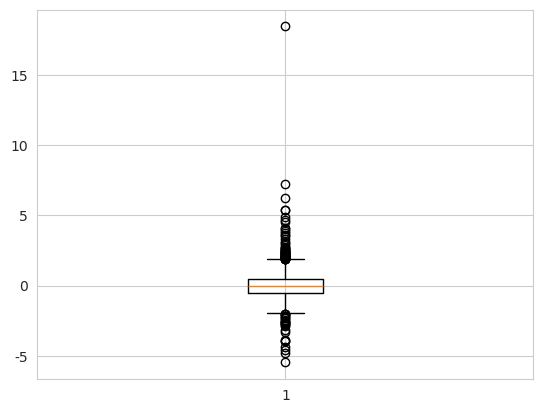

In [47]:
plt.boxplot(school_zindex_merge['z_total'])
plt.show()

#### 상위 그룹 / 하위 그룹 라벨링

In [48]:
# 상위 10%는 1, 나머지는 0으로 라벨링
cutoff = school_zindex_merge['z_total'].quantile(0.90)
school_zindex_merge['label'] = (school_zindex_merge['z_total'] >= cutoff).astype(int)

In [63]:
school_zindex_merge.to_csv('/home/jovyan/work/data/school_index_merge.csv', index=False)

In [ ]:
# 유저 라벨링 파켓 파일 정리
# school_zindex_merge = pd.read_csv('/home/jovyan/work/data/school_index_merge.csv')
# school_zindex_merge = school_zindex_merge.drop(columns=['node','propagation_time_secs'])
# school_zindex_merge.to_parquet('/home/jovyan/work/data/school_index_labeling.parquet', index=False)

### 4. Additional Features

In [ ]:
accounts_school = pd.read_csv('/home/jovyan/work/data/accounts_school.csv')
accounts_school = accounts_school.rename(columns={'id':'school_id'})

In [50]:
# GCS에서 Parquet 파일 불러오기 (hackle 관련 데이터)
school_vote_sum = pd.read_parquet("gs://sprintda05_final_project/machine_learning/school/school_vote_sum.parquet", engine='pyarrow')
inssa_users = pd.read_parquet("gs://sprintda05_final_project/machine_learning/school/inssa_users.parquet", engine='pyarrow')
friend_count_avg = pd.read_parquet("gs://sprintda05_final_project/machine_learning/school/friend_count_avg.parquet", engine='pyarrow')
near_school_cnt = pd.read_parquet("gs://sprintda05_final_project/machine_learning/school/near_school_cnt.parquet", engine='pyarrow')
days_diff = pd.read_parquet("gs://sprintda05_final_project/machine_learning/school/days_diff.parquet", engine='pyarrow') 
school_avg = pd.read_parquet("gs://sprintda05_final_project/machine_learning/school/school_avg.parquet", engine='pyarrow')
unique_id_count = pd.read_parquet("gs://sprintda05_final_project/machine_learning/school/unique_id_count.parquet", engine='pyarrow')
group_id_count_avg = pd.read_parquet("gs://sprintda05_final_project/machine_learning/school/group_id_count_avg.parquet", engine='pyarrow')

# 저장할 디렉토리 경로
save_directory = "/home/jovyan/work/data"

# 디렉토리가 존재하지 않으면 생성
os.makedirs(save_directory, exist_ok=True)

# CSV 파일로 저장
school_vote_sum.to_csv(os.path.join(save_directory, "school_vote_sum.csv"), index=False)
print(f"- school_vote_sum.csv")

inssa_users.to_csv(os.path.join(save_directory, "inssa_users.csv"), index=False)
print(f"- inssa_users.csv")

friend_count_avg.to_csv(os.path.join(save_directory, "friend_count_avg.csv"), index=False)
print(f"- friend_count_avg.csv")

near_school_cnt.to_csv(os.path.join(save_directory, "near_school_cnt.csv"), index=False)
print(f"- near_school_cnt.csv")

days_diff.to_csv(os.path.join(save_directory, "days_diff.csv"), index=False)
print(f"- days_diff.csv")

school_avg.to_csv(os.path.join(save_directory, "school_avg.csv"), index=False)
print(f"- school_avg.csv")

unique_id_count.to_csv(os.path.join(save_directory, "unique_id_count.csv"), index=False)
print(f"- unique_id_count.csv")

group_id_count_avg.to_csv(os.path.join(save_directory, "group_id_count_avg.csv"), index=False)
print(f"- group_id_count_avg.csv")

print(f"저장 위치: {save_directory}")

- school_vote_sum.csv
- inssa_users.csv
- friend_count_avg.csv
- near_school_cnt.csv
- days_diff.csv
- school_avg.csv
- unique_id_count.csv
- group_id_count_avg.csv
저장 위치: /home/jovyan/work/data


In [ ]:
school_zindex_merge = pd.read_csv('/home/jovyan/work/data/school_index_merge.csv')
school_zindex_merge = school_zindex_merge.drop(columns=['school_id', 'propagation_time_secs'])
school_zindex_merge = school_zindex_merge.rename(columns={'node': 'school_id'})
school_zindex_merge.head(1)

,school_id,degree,betweenness,pagerank,closeness,propagation_speed,degree_z,betweenness_z,pagerank_z,closeness_z,prop_speed_z,z_total,label
0,5457,82,2804.13413,0.000179,0.392425,21196.3459,0.12432,-0.290745,-0.063524,0.658682,0.32706,0.151159,0


In [61]:
school_zindex_merge.shape

(5347, 13)

In [ ]:
school_feature_final = pd.merge(school_zindex_merge, school_vote_sum, on='school_id')
school_feature_final.shape

(5347, 14)

In [63]:
school_feature_final = pd.merge(school_feature_final, inssa_users, on='school_id')
school_feature_final.shape

(5347, 15)

In [64]:
school_feature_final = pd.merge(school_feature_final, friend_count_avg, on='school_id')
school_feature_final.shape

(5347, 16)

In [65]:
school_feature_final = pd.merge(school_feature_final, near_school_cnt, on='school_id')
school_feature_final.shape

(5347, 17)

In [66]:
school_feature_final = pd.merge(school_feature_final, days_diff, on='school_id')
school_feature_final.shape

(5346, 18)

In [67]:
school_feature_final = pd.merge(school_feature_final, school_avg, on='school_id')
school_feature_final.shape

(5346, 19)

In [68]:
school_feature_final = pd.merge(school_feature_final, unique_id_count, on='school_id')
school_feature_final.shape

(5346, 20)

In [69]:
school_feature_final = pd.merge(school_feature_final, group_id_count_avg, on='school_id')
school_feature_final.shape

(5346, 21)

In [88]:
school_feature_final = pd.merge(school_feature_final, accounts_school, on='school_id')
school_feature_final.shape

(5346, 24)

In [89]:
school_feature_final.to_csv('/home/jovyan/work/data/school_feature_final.csv', index=False)

In [3]:
school_feature_final = pd.read_csv('/home/jovyan/work/data/school_feature_final.csv')

In [90]:
school_feature_final.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5346 entries, 0 to 5345
Data columns (total 24 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   school_id          5346 non-null   int64  
 1   degree             5346 non-null   int64  
 2   betweenness        5346 non-null   float64
 3   pagerank           5346 non-null   float64
 4   closeness          5346 non-null   float64
 5   propagation_speed  5346 non-null   float64
 6   degree_z           5346 non-null   float64
 7   betweenness_z      5346 non-null   float64
 8   pagerank_z         5346 non-null   float64
 9   closeness_z        5346 non-null   float64
 10  prop_speed_z       5346 non-null   float64
 11  z_total            5346 non-null   float64
 12  label              5346 non-null   int64  
 13  vote_count         5346 non-null   float64
 14  inssa_count        5346 non-null   float64
 15  friend_count_avg   5346 non-null   float64
 16  near_school_cnt    5346 

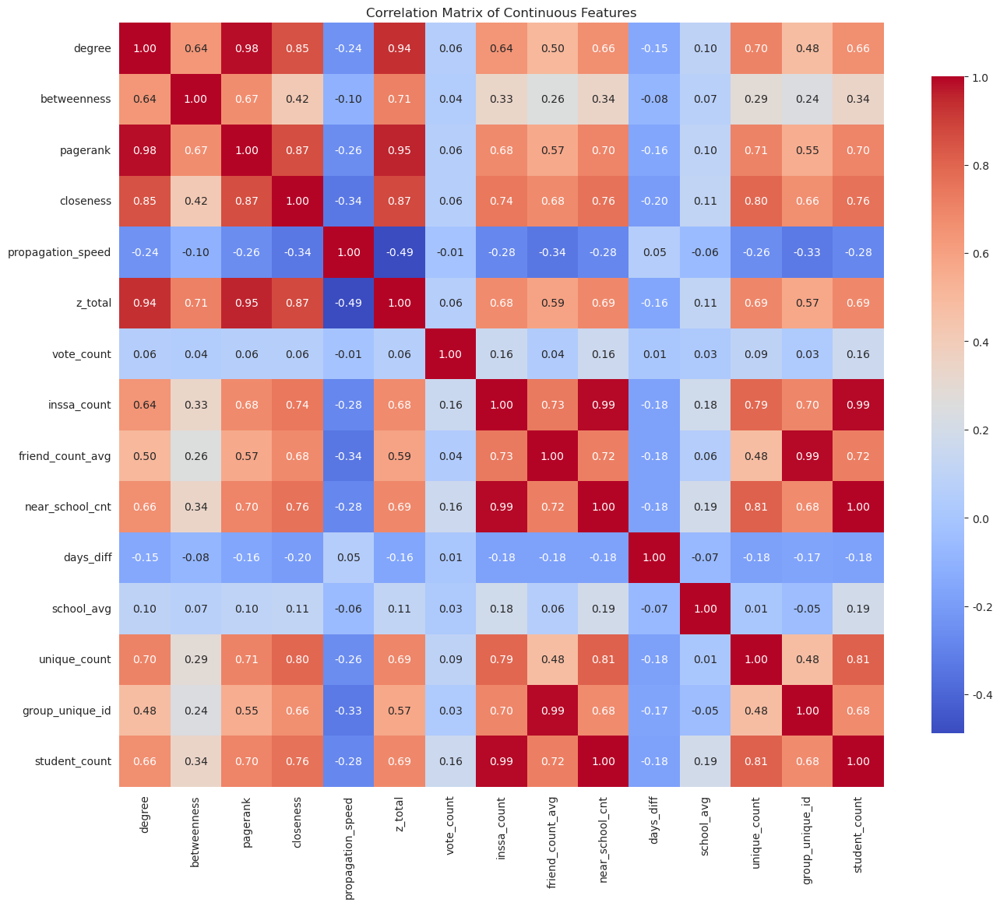

In [91]:
# 1. 수치형(연속형) 변수만 선택
numeric_df = school_feature_final.select_dtypes(include=['int64', 'float64'])

# 2. 상관관계 행렬 계산
corr_matrix = numeric_df.drop(columns=['school_id', 'label', 'degree_z', 'betweenness_z', 'pagerank_z', 'closeness_z', 'prop_speed_z']).corr()

# 3. 히트맵으로 시각화
plt.figure(figsize=(14, 12))
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap='coolwarm', square=True, cbar_kws={"shrink": .8})
plt.title("Correlation Matrix of Continuous Features")
plt.tight_layout()
plt.show()

In [92]:
# 2. 상관관계 계산
corr_matrix = numeric_df.corr().abs()

# 3. 상위 삼각행렬(자기 자신 제외)만 추출
upper = corr_matrix.where(
    np.triu(np.ones(corr_matrix.shape), k=1).astype(bool)
)

# 4. 상관계수 0.9 이상인 쌍 추출
high_corr_pairs = [
    (col, row, upper.loc[row, col])
    for col in upper.columns
    for row in upper.index
    if upper.loc[row, col] >= 0.9
]

# 5. 결과 출력
for a, b, corr_val in high_corr_pairs:
    print(f"{a} ↔ {b} : correlation = {corr_val:.2f}")

pagerank ↔ degree : correlation = 0.98
degree_z ↔ degree : correlation = 1.00
degree_z ↔ pagerank : correlation = 0.98
betweenness_z ↔ betweenness : correlation = 1.00
pagerank_z ↔ degree : correlation = 0.98
pagerank_z ↔ pagerank : correlation = 1.00
pagerank_z ↔ degree_z : correlation = 0.98
closeness_z ↔ closeness : correlation = 1.00
prop_speed_z ↔ propagation_speed : correlation = 1.00
z_total ↔ degree : correlation = 0.94
z_total ↔ pagerank : correlation = 0.95
z_total ↔ degree_z : correlation = 0.94
z_total ↔ pagerank_z : correlation = 0.95
near_school_cnt ↔ inssa_count : correlation = 0.99
group_unique_id ↔ friend_count_avg : correlation = 0.99
student_count ↔ inssa_count : correlation = 0.99
student_count ↔ near_school_cnt : correlation = 1.00


### 5. Classifier

In [148]:
# 라벨 (상위 10%인지 여부)
y = school_feature_final['label']

# feature 선택
X = school_feature_final.drop(columns=['school_id', 'label', 'degree', 'betweenness', 'pagerank', 'closeness', 'propagation_speed',
                                       'degree_z', 'betweenness_z', 'pagerank_z', 'closeness_z', 'prop_speed_z', 'z_total',
                                       'inssa_count', 'friend_count_avg', 'student_count'])

In [95]:
X.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5346 entries, 0 to 5345
Data columns (total 8 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   vote_count       5346 non-null   float64
 1   near_school_cnt  5346 non-null   int64  
 2   days_diff        5346 non-null   int64  
 3   school_avg       5346 non-null   float64
 4   unique_count     5346 non-null   int64  
 5   group_unique_id  5346 non-null   float64
 6   address          5346 non-null   object 
 7   school_type      5346 non-null   object 
dtypes: float64(3), int64(3), object(2)
memory usage: 334.3+ KB


#### XGBoost Classifier

In [149]:
# 전처리
preprocessor = ColumnTransformer(transformers=[
    ('standard', StandardScaler(), ['vote_count', 'near_school_cnt', 'days_diff', 'school_avg', 'unique_count', 'group_unique_id']),
    ('onehot', OneHotEncoder(handle_unknown='ignore'), ['address', 'school_type'])
])

# 전체 파이프라인
pipeline = ImbPipeline(steps=[
    ('preprocess', preprocessor),
    ('smote', SMOTE(random_state=42)),
    ('clf', XGBClassifier(random_state=42, use_label_encoder=False, eval_metric='logloss'))
])

In [119]:
# train/test 분할
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, test_size=0.2, random_state=42)

# 학습
pipeline.fit(X_train, y_train)

/opt/conda/lib/python3.11/site-packages/xgboost/training.py:183: UserWarning: [02:36:36] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Pipeline(steps=[('preprocess',
                 ColumnTransformer(transformers=[('standard', StandardScaler(),
                                                  ['vote_count',
                                                   'near_school_cnt',
                                                   'days_diff', 'school_avg',
                                                   'unique_count',
                                                   'group_unique_id']),
                                                 ('onehot',
                                                  OneHotEncoder(handle_unknown='ignore'),
                                                  ['address',
                                                   'school_type'])])),
                ('smote', SMOTE(random_state=42)),
                ('clf',
                 XGBClassifier(base_score=None, booster=None, callb...
                               feature_types=None, feature_weights=None,
                               gamma=None, grow_policy=None,
                               importance_type=None,
                               interaction_constraints=None, learning_rate=None,
                               max_bin=None, max_cat_threshold=None,
                               max_cat_to_onehot=None, max_delta_step=None,
                               max_depth=None, max_leaves=None,
                               min_child_weight=None, missing=nan,
                               monotone_constraints=None, multi_strategy=None,
                               n_estimators=None, n_jobs=None,
                               num_parallel_tree=None, ...))])

In [120]:
thresholds = np.arange(0.0, 1.0, 0.01)
best_f1 = 0
best_threshold = 0

# 모델 예측 결과는 미리 받아둠
y_proba = pipeline.predict_proba(X_test)[:, 1]

for t in thresholds:
    y_pred_thresh = (y_proba >= t).astype(int)
    score = f1_score(y_test, y_pred_thresh)
    if score > best_f1:
        best_f1 = score
        best_threshold = t

print(f"Best threshold: {best_threshold:.2f}, Best F1-score: {best_f1:.3f}")

Best threshold: 0.62, Best F1-score: 0.531


In [121]:
# threshold 조정
threshold = best_threshold

# 확률 예측 → threshold 적용
y_proba = pipeline.predict_proba(X_test)[:, 1]
y_pred_thresh = (y_proba >= threshold).astype(int)

# 평가 출력
print(f"Threshold: {threshold}")
print(confusion_matrix(y_test, y_pred_thresh))
print(classification_report(y_test, y_pred_thresh))

Threshold: 0.62
[[929  34]
 [ 56  51]]
              precision    recall  f1-score   support

           0       0.94      0.96      0.95       963
           1       0.60      0.48      0.53       107

    accuracy                           0.92      1070
   macro avg       0.77      0.72      0.74      1070
weighted avg       0.91      0.92      0.91      1070



(4276, 276) 276


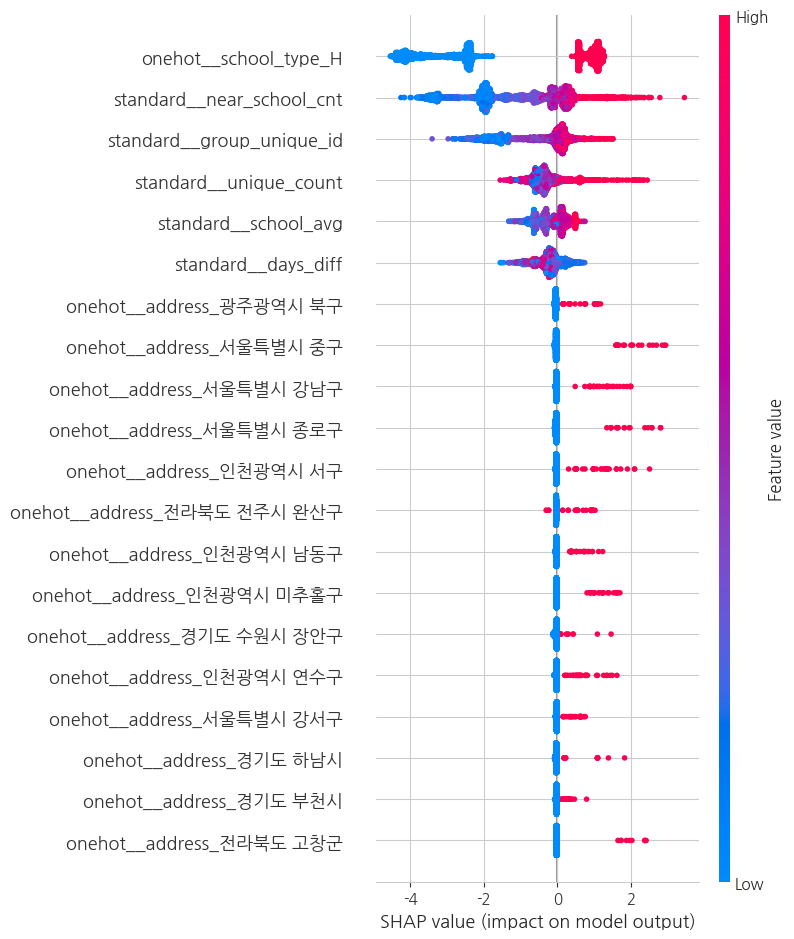

In [128]:
# 한글 폰트
font_path = "/home/jovyan/work/data/nanum-gothic/NanumGothic.ttf"
font_prop = fm.FontProperties(fname=font_path).get_name()
plt.rcParams['font.family'] = font_prop
plt.rcParams['axes.unicode_minus'] = False

X_train_transformed = pipeline.named_steps['preprocess'].transform(X_train)
feature_names = pipeline.named_steps['preprocess'].get_feature_names_out()

from scipy import sparse
if sparse.issparse(X_train_transformed):
    X_train_dense = X_train_transformed.toarray()
else:
    X_train_dense = X_train_transformed

# Step 2: feature_names 길이 확인
print(X_train_dense.shape, len(feature_names))  # 둘 다 (4276, 276)이 되어야 정상

# Step 3: DataFrame 생성
X_train_df = pd.DataFrame(X_train_dense, columns=feature_names)

model = pipeline.named_steps['clf']

explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(X_train_transformed)

shap.summary_plot(shap_values, X_train_df)

#### LightGBM Classifier

In [164]:
pipeline.set_params(clf=LGBMClassifier(random_state=42))
pipeline.fit(X, y)

[LightGBM] [Info] Number of positive: 4811, number of negative: 4811
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005023 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3561
[LightGBM] [Info] Number of data points in the train set: 9622, number of used features: 179
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000


Pipeline(steps=[('preprocess',
                 ColumnTransformer(transformers=[('standard', StandardScaler(),
                                                  ['vote_count',
                                                   'near_school_cnt',
                                                   'days_diff', 'school_avg',
                                                   'unique_count',
                                                   'group_unique_id']),
                                                 ('onehot',
                                                  OneHotEncoder(handle_unknown='ignore'),
                                                  ['address',
                                                   'school_type'])])),
                ('smote', SMOTE(random_state=42)),
                ('clf', LGBMClassifier(random_state=42))])

In [165]:
thresholds = np.arange(0.0, 1.0, 0.01)
best_f1 = 0
best_threshold = 0

# 모델 예측 결과는 미리 받아둠
y_proba = pipeline.predict_proba(X_test)[:, 1]

for t in thresholds:
    y_pred_thresh = (y_proba >= t).astype(int)
    score = f1_score(y_test, y_pred_thresh)
    if score > best_f1:
        best_f1 = score
        best_threshold = t

print(f"Best threshold: {best_threshold:.2f}, Best F1-score: {best_f1:.3f}")

Best threshold: 0.45, Best F1-score: 0.842


In [166]:
# threshold 조정
threshold = best_threshold

# 확률 예측 → threshold 적용
y_proba = pipeline.predict_proba(X_test)[:, 1]
y_pred_thresh = (y_proba >= threshold).astype(int)

# 평가 출력
print(f"Threshold: {threshold}")
print(confusion_matrix(y_test, y_pred_thresh))
print(classification_report(y_test, y_pred_thresh))

Threshold: 0.45
[[938  25]
 [ 11  96]]
              precision    recall  f1-score   support

           0       0.99      0.97      0.98       963
           1       0.79      0.90      0.84       107

    accuracy                           0.97      1070
   macro avg       0.89      0.94      0.91      1070
weighted avg       0.97      0.97      0.97      1070



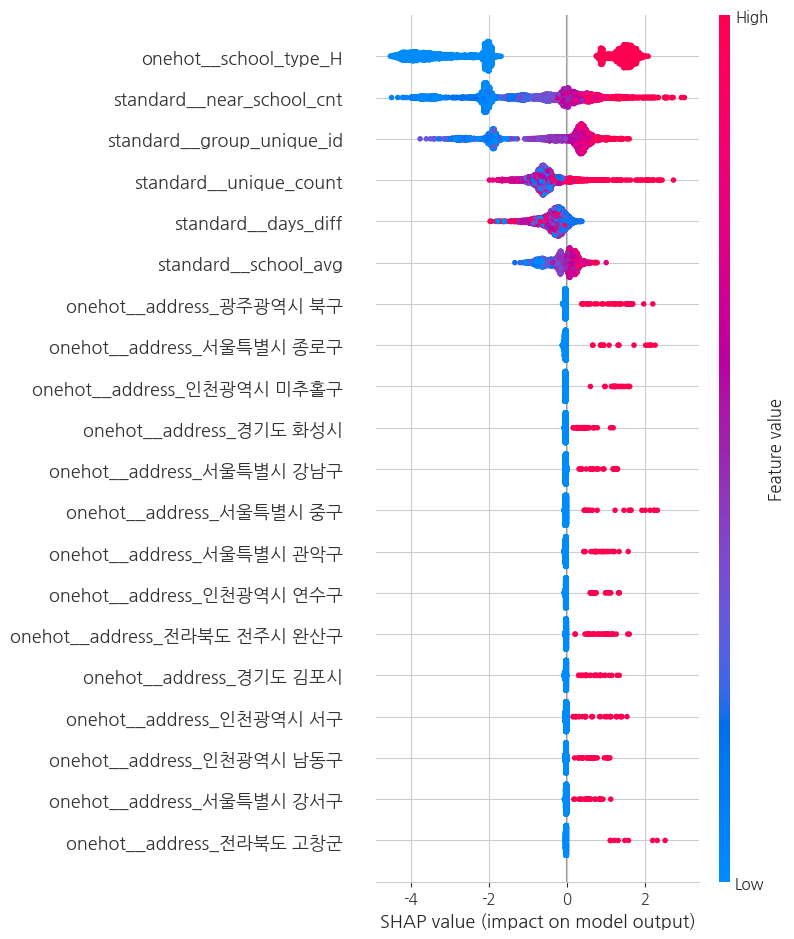

In [167]:
# 한글 폰트
font_path = "/home/jovyan/work/data/nanum-gothic/NanumGothic.ttf"
font_prop = fm.FontProperties(fname=font_path).get_name()
plt.rcParams['font.family'] = font_prop
plt.rcParams['axes.unicode_minus'] = False

X_train_transformed = pipeline.named_steps['preprocess'].transform(X_train)
feature_names = pipeline.named_steps['preprocess'].get_feature_names_out()

import numpy as np
from scipy.sparse import issparse

# SHAP 값이 sparse면 dense로 변환
if issparse(shap_values):
    shap_values = shap_values.toarray()

# class 정의: SHAP이 list로 인식 못하게만 속임
class FakeNdArray(np.ndarray):
    pass

# ndarray로 형변환
shap_values_safe = shap_values.view(FakeNdArray)

# summary plot 실행
shap.summary_plot(shap_values_safe, X_train_df)

#### CatBoost Classifier

In [133]:
pipeline.set_params(clf=CatBoostClassifier(random_state=42, verbose=0))
pipeline.fit(X, y)

Pipeline(steps=[('preprocess',
                 ColumnTransformer(transformers=[('standard', StandardScaler(),
                                                  ['vote_count',
                                                   'near_school_cnt',
                                                   'days_diff', 'school_avg',
                                                   'unique_count',
                                                   'group_unique_id']),
                                                 ('onehot',
                                                  OneHotEncoder(handle_unknown='ignore'),
                                                  ['address',
                                                   'school_type'])])),
                ('smote', SMOTE(random_state=42)),
                ('clf',
                 <catboost.core.CatBoostClassifier object at 0xfffee83e6910>)])

In [134]:
thresholds = np.arange(0.0, 1.0, 0.01)
best_f1 = 0
best_threshold = 0

# 모델 예측 결과는 미리 받아둠
y_proba = pipeline.predict_proba(X_test)[:, 1]

for t in thresholds:
    y_pred_thresh = (y_proba >= t).astype(int)
    score = f1_score(y_test, y_pred_thresh)
    if score > best_f1:
        best_f1 = score
        best_threshold = t

print(f"Best threshold: {best_threshold:.2f}, Best F1-score: {best_f1:.3f}")

Best threshold: 0.54, Best F1-score: 0.839


In [135]:
# threshold 조정
threshold = best_threshold

# 확률 예측 → threshold 적용
y_proba = pipeline.predict_proba(X_test)[:, 1]
y_pred_thresh = (y_proba >= threshold).astype(int)

# 평가 출력
print(f"Threshold: {threshold}")
print(confusion_matrix(y_test, y_pred_thresh))
print(classification_report(y_test, y_pred_thresh))

Threshold: 0.54
[[944  19]
 [ 16  91]]
              precision    recall  f1-score   support

           0       0.98      0.98      0.98       963
           1       0.83      0.85      0.84       107

    accuracy                           0.97      1070
   macro avg       0.91      0.92      0.91      1070
weighted avg       0.97      0.97      0.97      1070



(4276, 282) 282


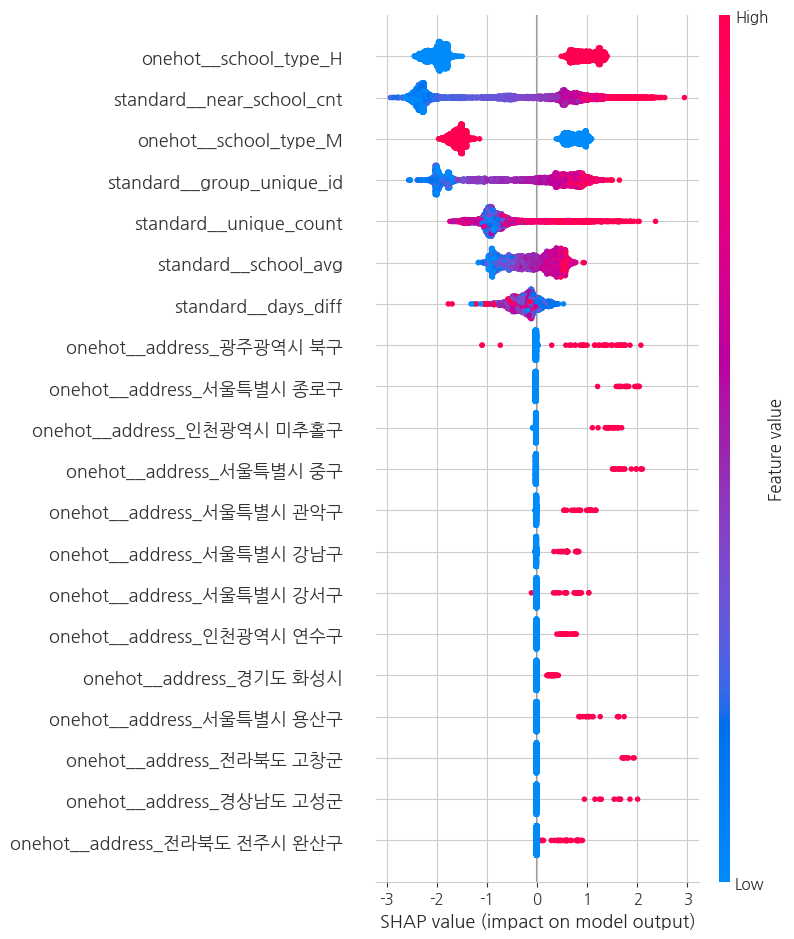

In [136]:
# 한글 폰트
font_path = "/home/jovyan/work/data/nanum-gothic/NanumGothic.ttf"
font_prop = fm.FontProperties(fname=font_path).get_name()
plt.rcParams['font.family'] = font_prop
plt.rcParams['axes.unicode_minus'] = False

X_train_transformed = pipeline.named_steps['preprocess'].transform(X_train)
feature_names = pipeline.named_steps['preprocess'].get_feature_names_out()

from scipy import sparse
if sparse.issparse(X_train_transformed):
    X_train_dense = X_train_transformed.toarray()
else:
    X_train_dense = X_train_transformed

# Step 2: feature_names 길이 확인
print(X_train_dense.shape, len(feature_names))  # 둘 다 (4276, 276)이 되어야 정상

# Step 3: DataFrame 생성
X_train_df = pd.DataFrame(X_train_dense, columns=feature_names)

model = pipeline.named_steps['clf']

explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(X_train_transformed)

shap.summary_plot(shap_values, X_train_df)

#### RandomForest Classifier

In [113]:
pipeline.set_params(clf=RandomForestClassifier(random_state=42))
pipeline.fit(X, y)

Pipeline(steps=[('preprocess',
                 ColumnTransformer(transformers=[('standard', StandardScaler(),
                                                  ['vote_count',
                                                   'near_school_cnt',
                                                   'days_diff', 'school_avg',
                                                   'unique_count',
                                                   'group_unique_id']),
                                                 ('onehot',
                                                  OneHotEncoder(handle_unknown='ignore'),
                                                  ['address',
                                                   'school_type'])])),
                ('smote', SMOTE(random_state=42)),
                ('clf', RandomForestClassifier(random_state=42))])

In [114]:
thresholds = np.arange(0.0, 1.0, 0.01)
best_f1 = 0
best_threshold = 0

# 모델 예측 결과는 미리 받아둠
y_proba = pipeline.predict_proba(X_test)[:, 1]

for t in thresholds:
    y_pred_thresh = (y_proba >= t).astype(int)
    score = f1_score(y_test, y_pred_thresh)
    if score > best_f1:
        best_f1 = score
        best_threshold = t

print(f"Best threshold: {best_threshold:.2f}, Best F1-score: {best_f1:.3f}")

Best threshold: 0.37, Best F1-score: 1.000


In [115]:
# threshold 조정
threshold = best_threshold

# 확률 예측 → threshold 적용
y_proba = pipeline.predict_proba(X_test)[:, 1]
y_pred_thresh = (y_proba >= threshold).astype(int)

# 평가 출력
print(f"Threshold: {threshold}")
print(confusion_matrix(y_test, y_pred_thresh))
print(classification_report(y_test, y_pred_thresh))

Threshold: 0.37
[[963   0]
 [  0 107]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       963
           1       1.00      1.00      1.00       107

    accuracy                           1.00      1070
   macro avg       1.00      1.00      1.00      1070
weighted avg       1.00      1.00      1.00      1070



#### SMOTEENN

### 6. Prediction Model

In [180]:
school_feature_final.columns

Index(['school_id', 'degree', 'betweenness', 'pagerank', 'closeness',
       'propagation_speed', 'degree_z', 'betweenness_z', 'pagerank_z',
       'closeness_z', 'prop_speed_z', 'z_total', 'label', 'vote_count',
       'inssa_count', 'friend_count_avg', 'near_school_cnt', 'days_diff',
       'school_avg', 'unique_count', 'group_unique_id', 'address',
       'student_count', 'school_type'],
      dtype='object')

In [4]:
y_reg = school_feature_final['z_total']
X_reg = school_feature_final.drop(columns=['school_id', 'label', 'degree', 'betweenness', 'pagerank', 'closeness', 'propagation_speed',
                                           'degree_z', 'betweenness_z', 'pagerank_z', 'closeness_z', 'prop_speed_z', 'z_total',
                                           'inssa_count', 'friend_count_avg', 'student_count'])

#### XGBRegressor

In [183]:
from xgboost import XGBRegressor
from sklearn.metrics import mean_squared_error, r2_score

preprocessor = ColumnTransformer(transformers=[
    ('standard', StandardScaler(), ['vote_count', 'near_school_cnt', 'days_diff', 'school_avg', 'unique_count', 'group_unique_id']),
    ('onehot', OneHotEncoder(handle_unknown='ignore'), ['address', 'school_type'])
])

# 회귀용 파이프라인 (이전과 거의 동일)
reg_pipeline = Pipeline(steps=[
    ('preprocess', preprocessor),  # 이전에 정의한 ColumnTransformer 재사용
    ('regressor', XGBRegressor(random_state=42))
])

# 학습/테스트 분할
X_train, X_test, y_train, y_test = train_test_split(X_reg, y_reg, test_size=0.2, random_state=42)

# 학습
reg_pipeline.fit(X_train, y_train)

# 예측
y_pred = reg_pipeline.predict(X_test)

# 평가
print("MSE:", mean_squared_error(y_test, y_pred))
print("R2:", r2_score(y_test, y_pred))

MSE: 0.17446664720486182
R2: 0.71890421632519


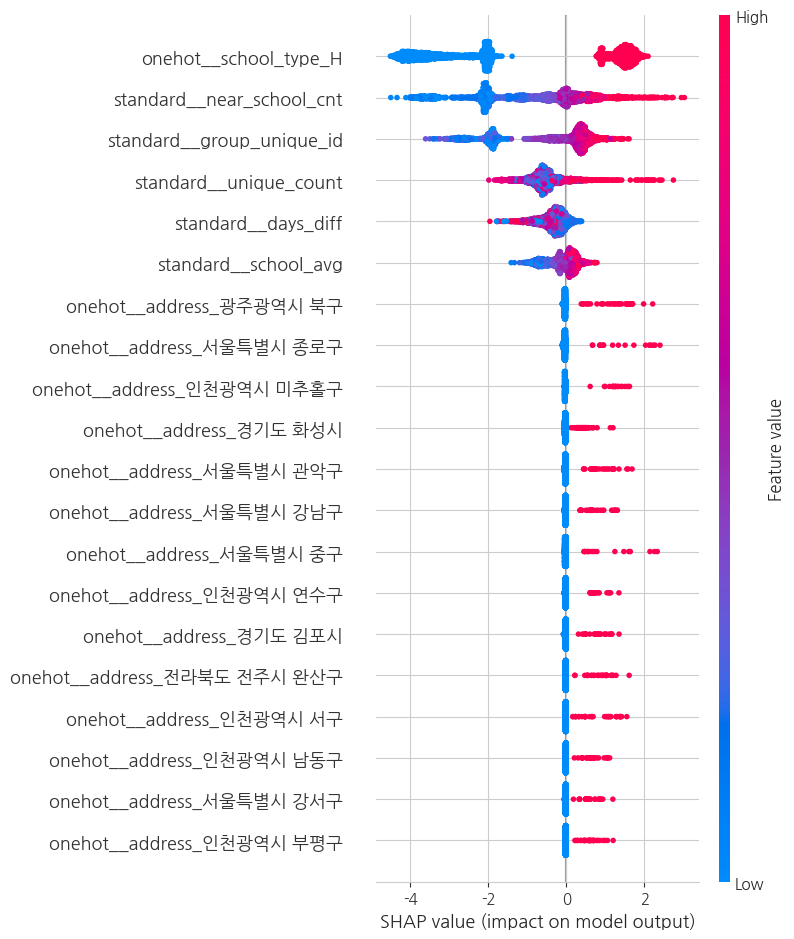

In [186]:
# 한글 폰트
font_path = "/home/jovyan/work/data/nanum-gothic/NanumGothic.ttf"
font_prop = fm.FontProperties(fname=font_path).get_name()
plt.rcParams['font.family'] = font_prop
plt.rcParams['axes.unicode_minus'] = False

X_train_transformed = pipeline.named_steps['preprocess'].transform(X_train)
feature_names = pipeline.named_steps['preprocess'].get_feature_names_out()

import numpy as np
from scipy.sparse import issparse

# SHAP 값이 sparse면 dense로 변환
if issparse(shap_values):
    shap_values = shap_values.toarray()

# class 정의: SHAP이 list로 인식 못하게만 속임
class FakeNdArray(np.ndarray):
    pass

# ndarray로 형변환
shap_values_safe = shap_values.view(FakeNdArray)

# summary plot 실행
shap.summary_plot(shap_values_safe, X_train_df)

#### 모델별 성능 비교

In [187]:
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.svm import SVR
from sklearn.metrics import mean_squared_error, r2_score

# 사용할 회귀 모델들 정의
models = {
    'XGBRegressor': XGBRegressor(random_state=42),
    'LinearRegression': LinearRegression(),
    'Ridge': Ridge(),
    'Lasso': Lasso(),
    'RandomForest': RandomForestRegressor(random_state=42),
    'GradientBoosting': GradientBoostingRegressor(random_state=42),
    'SVR': SVR()
}

# 결과 저장용 리스트
results = []

for name, model in models.items():
    # 파이프라인 정의 (preprocessor는 동일하게 사용)
    pipeline = Pipeline(steps=[
        ('preprocess', preprocessor),
        ('regressor', model)
    ])
    
    # 학습
    pipeline.fit(X_train, y_train)
    
    # 예측
    y_pred = pipeline.predict(X_test)
    
    # 평가 지표 계산
    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    
    results.append({
        'Model': name,
        'MSE': round(mse, 4),
        'R2': round(r2, 4)
    })

# 결과 표 생성 및 출력
import pandas as pd
results_df = pd.DataFrame(results)
print(results_df.sort_values(by='R2', ascending=False))

              Model     MSE      R2
6               SVR  0.1691  0.7276
0      XGBRegressor  0.1745  0.7189
5  GradientBoosting  0.1748  0.7183
2             Ridge  0.1798  0.7103
1  LinearRegression  0.1819  0.7070
4      RandomForest  0.1863  0.6998
3             Lasso  0.6207 -0.0000


#### SVR

In [5]:
from sklearn.svm import SVR
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score

# 전처리기 정의
preprocessor = ColumnTransformer(transformers=[
    ('standard', StandardScaler(), ['vote_count', 'near_school_cnt', 'days_diff', 'school_avg', 'unique_count', 'group_unique_id']),
    ('onehot', OneHotEncoder(handle_unknown='ignore'), ['address', 'school_type'])
])

# SVR 회귀용 파이프라인
reg_pipeline = Pipeline(steps=[
    ('preprocess', preprocessor),
    ('regressor', SVR())  # 기본 커널은 'rbf', 필요시 C, gamma 등 하이퍼파라미터 조정 가능
])

# 학습/테스트 분할
X_train, X_test, y_train, y_test = train_test_split(X_reg, y_reg, test_size=0.2, random_state=42)

# 학습
reg_pipeline.fit(X_train, y_train)

# 예측
y_pred = reg_pipeline.predict(X_test)

# 평가
print("MSE:", mean_squared_error(y_test, y_pred))
print("R2:", r2_score(y_test, y_pred))

MSE: 0.1690518284835215
R2: 0.7276284208440339


In [ ]:
# 한글 폰트
font_path = "/home/jovyan/work/data/nanum-gothic/NanumGothic.ttf"
font_prop = fm.FontProperties(fname=font_path).get_name()
plt.rcParams['font.family'] = font_prop
plt.rcParams['axes.unicode_minus'] = False

# 전처리만 수행한 X_test
X_test_transformed = reg_pipeline.named_steps['preprocess'].transform(X_test)

# 샘플 일부만 사용 (속도 개선용)
X_sample = shap.utils.sample(X_test_transformed, 100, random_state=42)

# 모델 함수 정의 (Pipeline 전체 대신 SVR만 사용)
model = reg_pipeline.named_steps['regressor']

# 예측 함수 정의 (SVR은 numpy 배열을 입력으로 받음)
predict_fn = lambda x: model.predict(x)

# KernelExplainer 생성
explainer = shap.KernelExplainer(predict_fn, X_sample)

# SHAP 값 계산 (속도상 일부 샘플에 대해 수행)
shap_values = explainer.shap_values(X_sample)

# 컬럼 이름 가져오기
# 전처리 후 컬럼 이름을 추출
feature_names = reg_pipeline.named_steps['preprocess'].get_feature_names_out()

# SHAP 요약 플롯
shap.summary_plot(shap_values, X_sample, feature_names=feature_names)

## 본격 분석 - 유저 네트워크

### 0. Preparing Network

#### 유저 네트워크 불러오기

In [2]:
with open('/home/jovyan/work/data/G.pkl', 'rb') as f:
    G_user_nx = pickle.load(f)
G_user_ig = ig.Graph.Read_GraphML('/home/jovyan/work/data/ig_graph.graphml')
G_user_nk = nk.graphio.readGraph("/home/jovyan/work/data/G_nk.graph", nk.Format.METIS)

In [3]:
print("Nodes:", len(G_user_nx.nodes()))
print("Edges:", len(G_user_nx.edges()))

Nodes: 677037
Edges: 18144551


### 1. Index Calculation

#### 중앙성 지표 계산

In [4]:
# Degree Centrality
deg_centrality = G_user_ig.degree()

In [5]:
len(deg_centrality)

677037

In [6]:
# ApproxBetweenness Centrality (NetworKit)
approx_btw = nk.centrality.ApproxBetweenness(G_user_nk, epsilon=0.1, delta=0.1)
approx_btw.run()
betweenness = approx_btw.scores()

In [ ]:
import psutil

def check_memory():
    """현재 메모리 사용량 확인"""
    mem = psutil.virtual_memory()
    used_gb = mem.used / (1024**3)
    total_gb = mem.total / (1024**3)
    percent = mem.percent
    
    print(f"💾 메모리: {used_gb:.1f}GB / {total_gb:.1f}GB ({percent:.1f}%)")
    
    if percent > 80:
        print("🔴 경고: 메모리 사용률 높음!")
    elif percent > 60:
        print("🟡 주의: 메모리 사용률 증가")
    else:
        print("🟢 메모리 상태 양호")
    
    return percent

# 현재 메모리 상태 확인
check_memory()

In [7]:
# PageRank (NetworKit)
pr = nk.centrality.PageRank(G_user_nk)
pr.run()
pagerank = pr.scores()

In [ ]:
# ApproxCloseness Centrality (NetworKit)
approx_clo = nk.centrality.ApproxCloseness(G_user_nk, nSamples=1000, normalized=True)
approx_clo.run()
closeness = approx_clo.scores()

In [ ]:
# ApproxCloseness가 NaN인 경우는 0으로 치환
closeness = np.nan_to_num(closeness, nan=0.0)

In [17]:
# 중앙성 지표 DataFrame 정리
user_centrality_df = pd.DataFrame({
    'node': G_user_ig.vs["name"],
    'degree': deg_centrality,
    'betweenness': betweenness,
    'pagerank': pagerank,
    'closeness': closeness
})
print(user_centrality_df.head())

        node  degree  betweenness  pagerank  closeness
0   927642.0      54          0.0  0.000001   0.169418
1   941316.0      75          0.0  0.000002   0.211149
2  1082761.0      92          0.0  0.000002   0.188750
3  1197039.0      55          0.0  0.000001   0.188537
4  1073919.0      58          0.0  0.000002   0.200763


In [18]:
user_centrality_df.isna().sum()

node           0
degree         0
betweenness    0
pagerank       0
closeness      0
dtype: int64

### 2. Total Index

#### Z-score 정규화

In [19]:
user_zindex_merge = user_centrality_df.copy()

# 중심성 지표들(Z‑score)
for col in ['degree', 'betweenness', 'pagerank', 'closeness']:
    user_zindex_merge[f'{col}_z'] = zscore(user_zindex_merge[col])

#### 종합 지표 연산

In [20]:
user_zindex_merge['z_total'] = (user_zindex_merge['degree_z'] + user_zindex_merge['betweenness_z'] + user_zindex_merge['pagerank_z'] + user_zindex_merge['closeness_z'])/4

In [21]:
user_zindex_merge['z_total'].describe()

count    6.770370e+05
mean    -4.782310e-16
std      6.293675e-01
min     -5.118650e+00
25%     -3.568823e-01
50%     -2.573316e-02
75%      3.201286e-01
max      3.452325e+01
Name: z_total, dtype: float64

### 3. Labeling

#### 종합 지표 분포 확인

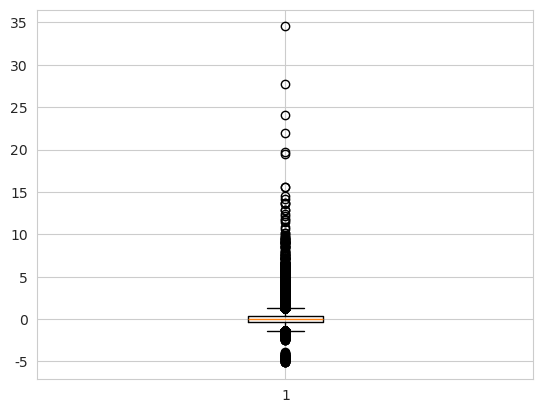

In [23]:
plt.boxplot(user_zindex_merge['z_total'])
plt.show()

#### 상위 그룹 / 하위 그룹 라벨링

In [53]:
# 상위 10%는 1, 나머지는 0으로 라벨링
cutoff = user_zindex_merge['z_total'].quantile(0.90)
user_zindex_merge['label'] = (user_zindex_merge['z_total'] >= cutoff).astype(int)

In [54]:
user_zindex_merge['label'].value_counts()

label
0    609333
1     67704
Name: count, dtype: int64

In [60]:
user_zindex_merge.to_csv('/home/jovyan/work/data/user_index_merge.csv', index=False)

### 4. Classifier (5 test features) - XGBoost Classifier

In [ ]:
# 유저 라벨링 파켓 파일 정리
# user_zindex_merge = pd.read_csv('/home/jovyan/work/data/user_index_merge.csv')
# user_zindex_merge['node'] = user_zindex_merge['node'].astype(int)
# user_zindex_merge = user_zindex_merge.drop(columns=['Unnamed: 0'])
# user_zindex_merge.to_parquet('/home/jovyan/work/data/user_index_labeling.parquet', index=False)

In [ ]:
user = pd.read_csv('/home/jovyan/work/data/user.csv')
user_zindex_merge = pd.read_csv('/home/jovyan/work/data/user_index_merge.csv')
user_zindex_merge['node'] = user_zindex_merge['node'].astype(int)
user_feature_merge = pd.merge(user, user_zindex_merge, left_on='user_id', right_on='node')
user_feature_merge = user_feature_merge.drop(columns=['Unnamed: 0'])
user_feature_merge['age'] = user_feature_merge['school_type'].apply(lambda x: 0 if x == 'M' else 3)
user_feature_merge['age'] += user_feature_merge['grade']

In [86]:
# 라벨 (상위 10%인지 여부)
y = user_feature_merge['label']

# 분석에서 제외할 열들 지정
exclude_cols = ['user_id', 'last_created_at', 'first_created_at_table', 
                'last_created_at_table', 'group_id', 'friend_id_list', 'id_x', 'grade',
                'class_num', 'school_id', 'id_y', 'address', 'student_count', 'school_type', 'node',
                'degree', 'betweenness', 'pagerank', 'closeness',
                'degree_z', 'betweenness_z', 'pagerank_z', 'closeness_z', 'z_total',
                'label']

# feature 선택
X = user_feature_merge.drop(columns=exclude_cols)

In [ ]:
# 가입 시점 컬럼 정수형으로 변환
X['first_created_at'] = pd.to_datetime(X['first_created_at'])
X['first_created_at_Y'] = X['first_created_at'].dt.year
X['first_created_at_M'] = X['first_created_at'].dt.month
X['first_created_at_numeric'] = X['first_created_at_Y'] * 12 + X['first_created_at_M']
X = X.drop(columns=['first_created_at', 'first_created_at_Y', 'first_created_at_M'])

# duration 컬럼 초로 변환
X['duration'] = pd.to_timedelta(X['duration']).dt.total_seconds()

#### preprocessing -> SMOTE

In [109]:
# 전처리기 정의
preprocessor = ColumnTransformer(transformers=[
    ('standard', StandardScaler(), ['duration', 'friend_count']),
    ('minmax', MinMaxScaler(), ['first_created_at_numeric']),
    ('ordinal', OrdinalEncoder(), ['age']),
    ('onehot', OneHotEncoder(handle_unknown='ignore'), ['gender'])
])

# 전체 파이프라인
pipeline = ImbPipeline(steps=[
    ('preprocess', preprocessor),
    ('smote', SMOTE(random_state=42)),
    ('clf', XGBClassifier(random_state=42, use_label_encoder=False, eval_metric='logloss'))
])

#### XGBoost Classifier 학습 및 평가

In [ ]:
# train/test 분할
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, test_size=0.2, random_state=42)

# 학습
pipeline.fit(X_train, y_train)

Pipeline(steps=[('preprocess',
                 ColumnTransformer(transformers=[('standard', StandardScaler(),
                                                  ['duration', 'friend_count']),
                                                 ('minmax', MinMaxScaler(),
                                                  ['first_created_at_numeric']),
                                                 ('ordinal', OrdinalEncoder(),
                                                  ['age']),
                                                 ('onehot',
                                                  OneHotEncoder(handle_unknown='ignore'),
                                                  ['gender'])])),
                ('smote', SMOTE(random_state=42)),
                ('clf',
                 XGBClassifier(base_score=None, boos...
                               feature_types=None, feature_weights=None,
                               gamma=None, grow_policy=None,
                               importance_type=None,
                               interaction_constraints=None, learning_rate=None,
                               max_bin=None, max_cat_threshold=None,
                               max_cat_to_onehot=None, max_delta_step=None,
                               max_depth=None, max_leaves=None,
                               min_child_weight=None, missing=nan,
                               monotone_constraints=None, multi_strategy=None,
                               n_estimators=None, n_jobs=None,
                               num_parallel_tree=None, ...))])

In [113]:
# 예측 및 평가
y_pred = pipeline.predict(X_test)
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))

[[101054  20232]
 [  2383  11157]]
              precision    recall  f1-score   support

           0       0.98      0.83      0.90    121286
           1       0.36      0.82      0.50     13540

    accuracy                           0.83    134826
   macro avg       0.67      0.83      0.70    134826
weighted avg       0.91      0.83      0.86    134826



Precision 0.36, F1=0.50 -> 개선된 모델 필요...

#### XGBoost threshold 조정

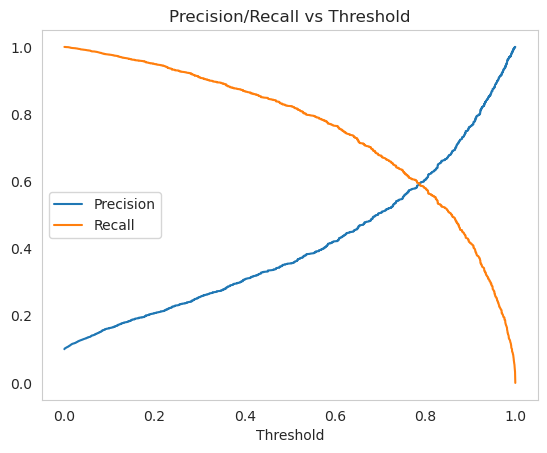

In [114]:
from sklearn.metrics import precision_recall_curve

# 확률값 추출
y_proba = pipeline.predict_proba(X_test)[:, 1]  # 클래스 1의 확률

# precision-recall curve 분석
precision, recall, thresholds = precision_recall_curve(y_test, y_proba)

plt.plot(thresholds, precision[:-1], label='Precision')
plt.plot(thresholds, recall[:-1], label='Recall')
plt.xlabel("Threshold")
plt.legend()
plt.grid()
plt.title("Precision/Recall vs Threshold")
plt.show()

In [116]:
from sklearn.metrics import f1_score

thresholds = np.arange(0.0, 1.0, 0.01)
best_f1 = 0
best_threshold = 0

# 모델 예측 결과는 미리 받아둠
y_proba = pipeline.predict_proba(X_test)[:, 1]

for t in thresholds:
    y_pred_thresh = (y_proba >= t).astype(int)
    score = f1_score(y_test, y_pred_thresh)
    if score > best_f1:
        best_f1 = score
        best_threshold = t

print(f"Best threshold: {best_threshold:.2f}, Best F1-score: {best_f1:.3f}")

Best threshold: 0.80, Best F1-score: 0.592


#### 전처리기 정의

In [ ]:
preprocessor = ColumnTransformer(transformers=[
    ('standard', StandardScaler(), ['duration', 'friend_count']),
    ('minmax', MinMaxScaler(), ['first_created_at_numeric']),
    ('ordinal', OrdinalEncoder(), ['age']),
    ('onehot', OneHotEncoder(handle_unknown='ignore'), ['gender'])
])

# 전체 파이프라인
pipeline = ImbPipeline(steps=[
    ('preprocess', preprocessor),
    ('smote', SMOTE(random_state=42)),
    ('clf', XGBClassifier(random_state=42, use_label_encoder=False, eval_metric='logloss'))
])

#### 학습 및 평가

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, test_size=0.2, random_state=42)

# 학습
pipeline.fit(X_train, y_train)

# threshold 조정
threshold = 0.80

# 확률 예측 → threshold 적용
y_proba = pipeline.predict_proba(X_test)[:, 1]
y_pred_thresh = (y_proba >= threshold).astype(int)

# 평가 출력
print(f"Threshold: {threshold}")
print(confusion_matrix(y_test, y_pred_thresh))
print(classification_report(y_test, y_pred_thresh))

Threshold: 0.8
[[116165   5121]
 [  5694   7846]]
              precision    recall  f1-score   support

           0       0.95      0.96      0.96    121286
           1       0.61      0.58      0.59     13540

    accuracy                           0.92    134826
   macro avg       0.78      0.77      0.77    134826
weighted avg       0.92      0.92      0.92    134826



#### SHAP 분석

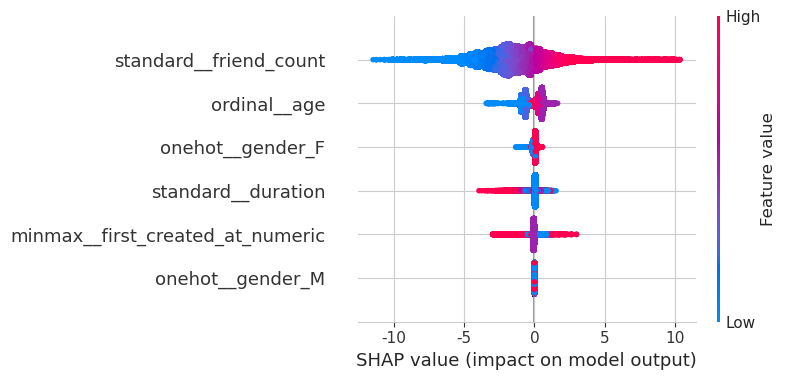

In [ ]:
X_train_transformed = pipeline.named_steps['preprocess'].transform(X_train)
feature_names = pipeline.named_steps['preprocess'].get_feature_names_out()

model = pipeline.named_steps['clf']

explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(X_train_transformed)

shap.summary_plot(shap_values, X_train_transformed, feature_names=feature_names)

### 5. Additional Features

#### GCS bucket > file download

In [3]:
# GCS에서 Parquet 파일 불러오기 (hackle 관련 데이터)
friend_request_features = pd.read_parquet("gs://sprintda05_final_project/machine_learning/votes/friend_request_features.parquet", engine='pyarrow')
answer_features = pd.read_parquet("gs://sprintda05_final_project/machine_learning/votes/answer_features.parquet", engine='pyarrow')
comprehensive_time_activity_features = pd.read_parquet("gs://sprintda05_final_project/machine_learning/votes/comprehensive_time_activity_features.parquet", engine='pyarrow')
features_moderation_summary = pd.read_parquet("gs://sprintda05_final_project/machine_learning/votes/features_moderation_summary.parquet", engine='pyarrow')
features_selfvote_summary = pd.read_parquet("gs://sprintda05_final_project/machine_learning/votes/features_selfvote_summary.parquet", engine='pyarrow') 
point_event_features = pd.read_parquet("gs://sprintda05_final_project/machine_learning/votes/point_event_features.parquet", engine='pyarrow')
vote_for = pd.read_parquet("gs://sprintda05_final_project/machine_learning/votes/vote_for.parquet", engine='pyarrow')

# 저장할 디렉토리 경로
save_directory = "/home/jovyan/work/data"

# 디렉토리가 존재하지 않으면 생성
os.makedirs(save_directory, exist_ok=True)

# CSV 파일로 저장
friend_request_features.to_csv(os.path.join(save_directory, "friend_request_features.csv"), index=False)
print(f"- friend_request_features.csv")

answer_features.to_csv(os.path.join(save_directory, "answer_features.csv"), index=False)
print(f"- hackle_device_properties.csv")

comprehensive_time_activity_features.to_csv(os.path.join(save_directory, "comprehensive_time_activity_features.csv"), index=False)
print(f"- comprehensive_time_activity_features.csv")

features_moderation_summary.to_csv(os.path.join(save_directory, "features_moderation_summary.csv"), index=False)
print(f"- features_moderation_summary.csv")

features_selfvote_summary.to_csv(os.path.join(save_directory, "features_selfvote_summary.csv"), index=False)
print(f"- features_selfvote_summary.csv")

point_event_features.to_csv(os.path.join(save_directory, "point_event_features.csv"), index=False)
print(f"- point_event_features.csv")

vote_for.to_csv(os.path.join(save_directory, "vote_for.csv"), index=False)
print(f"- vote_for.csv")

print(f"저장 위치: {save_directory}")

- friend_request_features.csv
- hackle_device_properties.csv
- comprehensive_time_activity_features.csv
- features_moderation_summary.csv
- features_selfvote_summary.csv
- point_event_features.csv
- vote_for.csv
저장 위치: /home/jovyan/work/data


#### friend_request_features

In [4]:
friend_request_features[['friend_requests_sent', 'friend_requests_received', 'friend_requests_accepted', 'friend_request_success_rate']].describe()

,friend_requests_sent,friend_requests_received,friend_requests_accepted,friend_request_success_rate
count,677085.000000,677085.000000,677085.000000,677085.000000
mean,25.324996,25.324996,19.020370,0.728983
std,23.917504,19.640052,16.831251,0.231868
min,0.000000,0.000000,0.000000,0.000000
25%,10.000000,10.000000,7.000000,0.666667
50%,20.000000,21.000000,15.000000,0.780488
75%,34.000000,37.000000,26.000000,0.870968
max,1816.000000,218.000000,654.000000,1.000000


#### answer_features

In [230]:
answer_features[['public_answers_count', 'private_answers_count', 'total_answers_count', 'public_answer_ratio']].describe()

,public_answers_count,private_answers_count,total_answers_count,public_answer_ratio
count,677085.000000,677085.000000,677085.000000,677085.000000
mean,0.165062,0.011616,0.176678,0.006012
std,3.221757,0.346857,3.406741,0.075043
min,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,0.000000
75%,0.000000,0.000000,0.000000,0.000000
max,338.000000,98.000000,353.000000,1.000000


#### comprehensive_time_activity_features

In [231]:
comprehensive_time_activity_features[['total_app_usage', 'night_owl_ratio', 'school_usage_ratio', 'evening_usage_ratio']].describe()

,total_app_usage,night_owl_ratio,school_usage_ratio,evening_usage_ratio
count,677085.000000,677085.000000,677085.000000,677085.000000
mean,38.102114,0.192101,0.558643,0.008162
std,162.935700,0.309934,0.394437,0.065617
min,0.000000,0.000000,0.000000,0.000000
25%,10.000000,0.000000,0.125000,0.000000
50%,20.000000,0.000000,0.640000,0.000000
75%,35.000000,0.250000,0.977273,0.000000
max,7360.000000,1.000000,1.000000,1.000000


#### features_moderation_summary

In [232]:
features_moderation_summary[['blocks_made', 'reports_made']].describe()

,blocks_made,reports_made
count,12627.000000,12627.000000
mean,1.540271,0.016473
std,2.863524,0.270313
min,0.000000,0.000000
25%,1.000000,0.000000
50%,1.000000,0.000000
75%,1.000000,0.000000
max,171.000000,19.000000


#### features_selfvote_summary

In [234]:
features_selfvote_summary[['self_vote_count', 'self_vote_ratio', 'has_self_voted']].describe()

,self_vote_count,self_vote_ratio
count,4849.000000,4849.000000
mean,0.404001,0.001917
std,2.643472,0.013406
min,0.000000,0.000000
25%,0.000000,0.000000
50%,0.000000,0.000000
75%,0.000000,0.000000
max,84.000000,0.375000


#### point_event_features

In [235]:
point_event_features[['participation_count', 'total_points', 'participated_in_point_event']].describe()

,participation_count,total_points
count,677085.000000,677085.000000
mean,0.000456,0.255507
std,0.021427,12.479982
min,0.000000,0.000000
25%,0.000000,0.000000
50%,0.000000,0.000000
75%,0.000000,0.000000
max,2.000000,1000.000000


#### vote_for

In [130]:
vote_for[['times_chosen', 'times_as_candidate', 'average_opened_times', 'popularity_score']].describe()

,times_chosen,times_as_candidate,average_opened_times,popularity_score
count,19994.000000,19994.000000,19994.000000,19994.000000
mean,60.896169,238.552016,0.060434,0.229480
std,120.102587,447.335059,0.181250,0.208503
min,0.000000,1.000000,0.000000,0.000000
25%,1.000000,7.000000,0.000000,0.050000
50%,6.000000,29.000000,0.000000,0.209627
75%,54.000000,220.000000,0.055556,0.333333
max,1239.000000,4226.000000,3.000000,1.000000


#### 유저가 가진 친구 리스트의 그룹아이디 unique 개수

In [7]:
user = pd.read_csv('/home/jovyan/work/data/user.csv')
user_zindex_merge = pd.read_csv('/home/jovyan/work/data/user_index_merge.csv')
user_zindex_merge['node'] = user_zindex_merge['node'].astype(int)
user_feature_merge = pd.merge(user, user_zindex_merge, left_on='user_id', right_on='node')
user_feature_merge = user_feature_merge.drop(columns=['Unnamed: 0'])
user_feature_merge['age'] = user_feature_merge['school_type'].apply(lambda x: 0 if x == 'M' else 3)
user_feature_merge['age'] += user_feature_merge['grade']

In [8]:
user_feature_merge.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 674129 entries, 0 to 674128
Data columns (total 30 columns):
 #   Column                  Non-Null Count   Dtype  
---  ------                  --------------   -----  
 0   user_id                 674129 non-null  int64  
 1   first_created_at        674129 non-null  object 
 2   last_created_at         674129 non-null  object 
 3   first_created_at_table  674129 non-null  object 
 4   last_created_at_table   674129 non-null  object 
 5   duration                674129 non-null  object 
 6   gender                  674129 non-null  object 
 7   group_id                674129 non-null  float64
 8   friend_id_list          674129 non-null  object 
 9   friend_count            674129 non-null  int64  
 10  id_x                    674129 non-null  int64  
 11  grade                   674129 non-null  int64  
 12  class_num               674129 non-null  int64  
 13  school_id               674129 non-null  int64  
 14  id_y                

In [9]:
import pandas as pd
import ast
from tqdm import tqdm

# tqdm 적용
tqdm.pandas()

user_group_id = user_feature_merge.copy()

# 1. user_id -> group_id 매핑 딕셔너리 생성
user_group_map = dict(zip(user_group_id['user_id'], user_group_id['group_id']))

# 2. friend_id_list가 문자열이므로 리스트로 변환
def parse_friend_list(friend_str):
    try:
        return ast.literal_eval(friend_str)  # 문자열 → 리스트 변환
    except:
        return []

user_group_id['parsed_friend_ids'] = user_group_id['friend_id_list'].apply(parse_friend_list)

# 3. 친구들의 group_id 가져와서 unique 개수 세기
def count_unique_friend_groups(friend_ids):
    group_ids = [user_group_map.get(fid) for fid in friend_ids if user_group_map.get(fid) is not None]
    return len(set(group_ids))

user_group_id['unique_friend_group_count'] = user_group_id['parsed_friend_ids'].progress_apply(count_unique_friend_groups)

# 필요시 중간 컬럼 정리
user_group_id.drop(columns=['parsed_friend_ids'], inplace=True)


100%|██████████| 674129/674129 [00:25<00:00, 26163.97it/s]


In [247]:
user_group_id[['user_id', 'unique_friend_group_count']].to_parquet('/home/jovyan/work/data/unique_friend_group_count.parquet', index=False)

#### features merge

In [10]:
user_feature_final = user_feature_merge.copy()

In [11]:
exclude_cols = ['last_created_at', 'first_created_at_table', 
                'last_created_at_table', 'group_id', 'friend_id_list', 'friend_count', 'id_x', 'grade',
                'class_num', 'school_id', 'id_y', 'address', 'student_count', 'school_type', 'node',
                'degree_z', 'betweenness_z', 'pagerank_z', 'closeness_z', 'z_total']

user_feature_final = user_feature_final.drop(columns=exclude_cols)

In [12]:
# 가입 시점 컬럼 정수형으로 변환
user_feature_final['first_created_at'] = pd.to_datetime(user_feature_final['first_created_at'])
user_feature_final['first_created_at_Y'] = user_feature_final['first_created_at'].dt.year
user_feature_final['first_created_at_M'] = user_feature_final['first_created_at'].dt.month
user_feature_final['first_created_at_numeric'] = user_feature_final['first_created_at_Y'] * 12 + user_feature_final['first_created_at_M']
user_feature_final = user_feature_final.drop(columns=['first_created_at', 'first_created_at_Y', 'first_created_at_M'])

# duration 컬럼 초로 변환
user_feature_final['duration'] = pd.to_timedelta(user_feature_final['duration']).dt.total_seconds()

In [13]:
user_feature_final = pd.merge(user_feature_final, friend_request_features[['user_id', 'friend_requests_sent', 'friend_requests_received', 'friend_requests_accepted', 'friend_request_success_rate']], on='user_id', how='inner')
user_feature_final = pd.merge(user_feature_final, answer_features[['user_id', 'public_answers_count', 'private_answers_count', 'total_answers_count', 'public_answer_ratio']], on='user_id', how='inner')
user_feature_final = pd.merge(user_feature_final, comprehensive_time_activity_features[['user_id', 'total_app_usage', 'night_owl_ratio', 'school_usage_ratio', 'evening_usage_ratio']], on='user_id', how='inner')
user_feature_final = pd.merge(user_feature_final, features_moderation_summary[['user_id', 'blocks_made', 'reports_made']], on='user_id', how='left')
user_feature_final = pd.merge(user_feature_final, features_selfvote_summary[['user_id', 'self_vote_count', 'self_vote_ratio', 'has_self_voted']], on='user_id', how='left')
user_feature_final = pd.merge(user_feature_final, point_event_features[['user_id', 'participation_count', 'total_points', 'participated_in_point_event']], on='user_id', how='inner')
user_feature_final = pd.merge(user_feature_final, vote_for[['user_id', 'times_chosen', 'times_as_candidate', 'average_opened_times', 'popularity_score']], on='user_id', how='inner')
user_feature_final = pd.merge(user_feature_final, user_group_id[['user_id', 'unique_friend_group_count']], on='user_id', how='inner')

In [14]:
user_feature_final.isna().sum()

user_id                             0
duration                            0
gender                              0
degree                              0
betweenness                         0
pagerank                            0
closeness                           0
label                               0
age                                 0
first_created_at_numeric            0
friend_requests_sent                0
friend_requests_received            0
friend_requests_accepted            0
friend_request_success_rate         0
public_answers_count                0
private_answers_count               0
total_answers_count                 0
public_answer_ratio                 0
total_app_usage                     0
night_owl_ratio                     0
school_usage_ratio                  0
evening_usage_ratio                 0
blocks_made                    661507
reports_made                   661507
self_vote_count                669280
self_vote_ratio                669280
has_self_vot

In [15]:
user_feature_final = user_feature_final.fillna(np.float64(0))

#### correlation

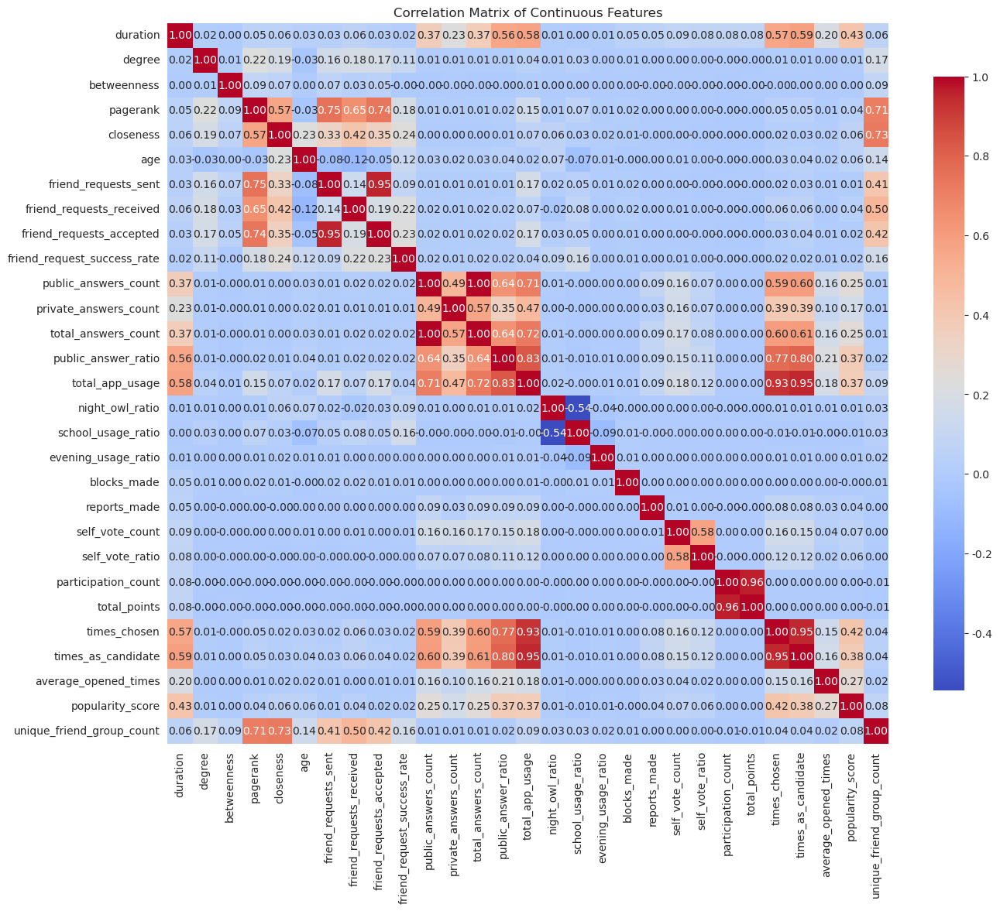

In [17]:
# 1. 수치형(연속형) 변수만 선택
numeric_df = user_feature_final.select_dtypes(include=['int64', 'float64'])

# 2. 상관관계 행렬 계산
corr_matrix = numeric_df.drop(columns=['user_id', 'label']).corr()

# 3. 히트맵으로 시각화
plt.figure(figsize=(14, 12))
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap='coolwarm', square=True, cbar_kws={"shrink": .8})
plt.title("Correlation Matrix of Continuous Features")
plt.tight_layout()
plt.show()

In [18]:
# 2. 상관관계 계산
corr_matrix = numeric_df.corr().abs()

# 3. 상위 삼각행렬(자기 자신 제외)만 추출
upper = corr_matrix.where(
    np.triu(np.ones(corr_matrix.shape), k=1).astype(bool)
)

# 4. 상관계수 0.9 이상인 쌍 추출
high_corr_pairs = [
    (col, row, upper.loc[row, col])
    for col in upper.columns
    for row in upper.index
    if upper.loc[row, col] >= 0.9
]

# 5. 결과 출력
for a, b, corr_val in high_corr_pairs:
    print(f"{a} ↔ {b} : correlation = {corr_val:.2f}")

friend_requests_accepted ↔ friend_requests_sent : correlation = 0.95
total_answers_count ↔ public_answers_count : correlation = 1.00
total_points ↔ participation_count : correlation = 0.96
times_chosen ↔ total_app_usage : correlation = 0.93
times_as_candidate ↔ total_app_usage : correlation = 0.95
times_as_candidate ↔ times_chosen : correlation = 0.95


In [19]:
user_feature_final = user_feature_final.drop(columns=['friend_requests_sent', 'total_answers_count', 'total_points', 'total_app_usage', 'times_as_candidate'])

In [20]:
user_feature_final.to_csv('/home/jovyan/work/data/user_feature_final.csv', index=False)

In [21]:
user_feature_final.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 674129 entries, 0 to 674128
Data columns (total 30 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   user_id                      674129 non-null  int64  
 1   duration                     674129 non-null  float64
 2   gender                       674129 non-null  object 
 3   degree                       674129 non-null  int64  
 4   betweenness                  674129 non-null  float64
 5   pagerank                     674129 non-null  float64
 6   closeness                    674129 non-null  float64
 7   label                        674129 non-null  int64  
 8   age                          674129 non-null  int64  
 9   first_created_at_numeric     674129 non-null  int32  
 10  friend_requests_received     674129 non-null  float64
 11  friend_requests_accepted     674129 non-null  float64
 12  friend_request_success_rate  674129 non-null  float64
 13 

### 6. XGBoost Classifier

In [4]:
user_feature_final = pd.read_csv('/home/jovyan/work/data/user_feature_final.csv')

/tmp/ipykernel_80281/3598016915.py:1: DtypeWarning: Columns (23) have mixed types. Specify dtype option on import or set low_memory=False.
  user_feature_final = pd.read_csv('/home/jovyan/work/data/user_feature_final.csv')


In [11]:
user_feature_final['has_self_voted'] = user_feature_final['has_self_voted'].astype(bool)

In [13]:
# 라벨 (상위 10%인지 여부)
y = user_feature_final['label']

# feature 선택
X = user_feature_final.drop(columns=['user_id', 'label', 'degree', 'betweenness', 'pagerank', 'closeness'])

#### XGBoost threshold 조정

In [ ]:
#  1   duration                     674129 non-null  float64    StandardScaler
#  2   gender                       674129 non-null  object     OneHotEncoder
#  3   age                          674129 non-null  int64      OrdinalEncoder
#  4   first_created_at_numeric     674129 non-null  int32      MinMaxScaler  
#  5   friend_requests_received     674129 non-null  float64    StandardScaler
#  6   friend_requests_accepted     674129 non-null  float64    StandardScaler
#  7   friend_request_success_rate  674129 non-null  float64    StandardScaler
#  8   public_answers_count         674129 non-null  float64    StandardScaler
#  9   private_answers_count        674129 non-null  float64    StandardScaler
#  10  public_answer_ratio          674129 non-null  float64    StandardScaler
#  11  night_owl_ratio              674129 non-null  float64    StandardScaler
#  12  school_usage_ratio           674129 non-null  float64    StandardScaler
#  13  evening_usage_ratio          674129 non-null  float64    StandardScaler
#  14  blocks_made                  674129 non-null  float64    StandardScaler
#  15  reports_made                 674129 non-null  float64    StandardScaler
#  16  self_vote_count              674129 non-null  float64    StandardScaler
#  17  self_vote_ratio              674129 non-null  float64    StandardScaler
#  18  has_self_voted               674129 non-null  bool       OneHotEncoder 
#  19  participation_count          674129 non-null  int64      StandardScaler
#  20  participated_in_point_event  674129 non-null  bool       OneHotEncoder
#  21  times_chosen                 674129 non-null  float64    StandardScaler
#  22  average_opened_times         674129 non-null  float64    StandardScaler
#  23  popularity_score             674129 non-null  float64    StandardScaler
#  24  unique_friend_group_count    674129 non-null  int64      StandardScaler

In [13]:
# 전처리
preprocessor = ColumnTransformer(transformers=[
    ('standard', StandardScaler(), ['duration', 'friend_requests_received', 'friend_requests_accepted', 'friend_request_success_rate',
                                    'public_answers_count', 'private_answers_count', 'public_answer_ratio',
                                    'night_owl_ratio', 'school_usage_ratio', 'evening_usage_ratio',
                                    'blocks_made', 'reports_made', 'self_vote_count', 'self_vote_ratio',
                                    'participation_count', 'times_chosen',
                                    'average_opened_times', 'popularity_score', 'unique_friend_group_count']),
    ('minmax', MinMaxScaler(), ['first_created_at_numeric']),
    ('ordinal', OrdinalEncoder(), ['age']),
    ('onehot', OneHotEncoder(handle_unknown='ignore'), ['gender', 'has_self_voted', 'participated_in_point_event'])
])

# 전체 파이프라인
pipeline = ImbPipeline(steps=[
    ('preprocess', preprocessor),
    ('smote', SMOTE(random_state=42)),
    ('clf', XGBClassifier(random_state=42, use_label_encoder=False, eval_metric='logloss'))
])

In [15]:
# train/test 분할
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, test_size=0.2, random_state=42)

# 학습
pipeline.fit(X_train, y_train)

Pipeline(steps=[('preprocess',
                 ColumnTransformer(transformers=[('standard', StandardScaler(),
                                                  ['duration',
                                                   'friend_requests_received',
                                                   'friend_requests_accepted',
                                                   'friend_request_success_rate',
                                                   'public_answers_count',
                                                   'private_answers_count',
                                                   'public_answer_ratio',
                                                   'night_owl_ratio',
                                                   'school_usage_ratio',
                                                   'evening_usage_ratio',
                                                   'blocks_made',
                                                   'reports_made',
                                                   'sel...
                               feature_types=None, feature_weights=None,
                               gamma=None, grow_policy=None,
                               importance_type=None,
                               interaction_constraints=None, learning_rate=None,
                               max_bin=None, max_cat_threshold=None,
                               max_cat_to_onehot=None, max_delta_step=None,
                               max_depth=None, max_leaves=None,
                               min_child_weight=None, missing=nan,
                               monotone_constraints=None, multi_strategy=None,
                               n_estimators=None, n_jobs=None,
                               num_parallel_tree=None, ...))])

In [16]:
thresholds = np.arange(0.0, 1.0, 0.01)
best_f1 = 0
best_threshold = 0

# 모델 예측 결과는 미리 받아둠
y_proba = pipeline.predict_proba(X_test)[:, 1]

for t in thresholds:
    y_pred_thresh = (y_proba >= t).astype(int)
    score = f1_score(y_test, y_pred_thresh)
    if score > best_f1:
        best_f1 = score
        best_threshold = t

print(f"Best threshold: {best_threshold:.2f}, Best F1-score: {best_f1:.3f}")

Best threshold: 0.51, Best F1-score: 0.592


#### XGBoost 학습 및 평가

In [17]:
# threshold 조정
threshold = best_threshold

# 확률 예측 → threshold 적용
y_proba = pipeline.predict_proba(X_test)[:, 1]
y_pred_thresh = (y_proba >= threshold).astype(int)

# 평가 출력
print(f"Threshold: {threshold}")
print(confusion_matrix(y_test, y_pred_thresh))
print(classification_report(y_test, y_pred_thresh))

Threshold: 0.51
[[115120   6166]
 [  5253   8287]]
              precision    recall  f1-score   support

           0       0.96      0.95      0.95    121286
           1       0.57      0.61      0.59     13540

    accuracy                           0.92    134826
   macro avg       0.76      0.78      0.77    134826
weighted avg       0.92      0.92      0.92    134826



#### SHAP 분석

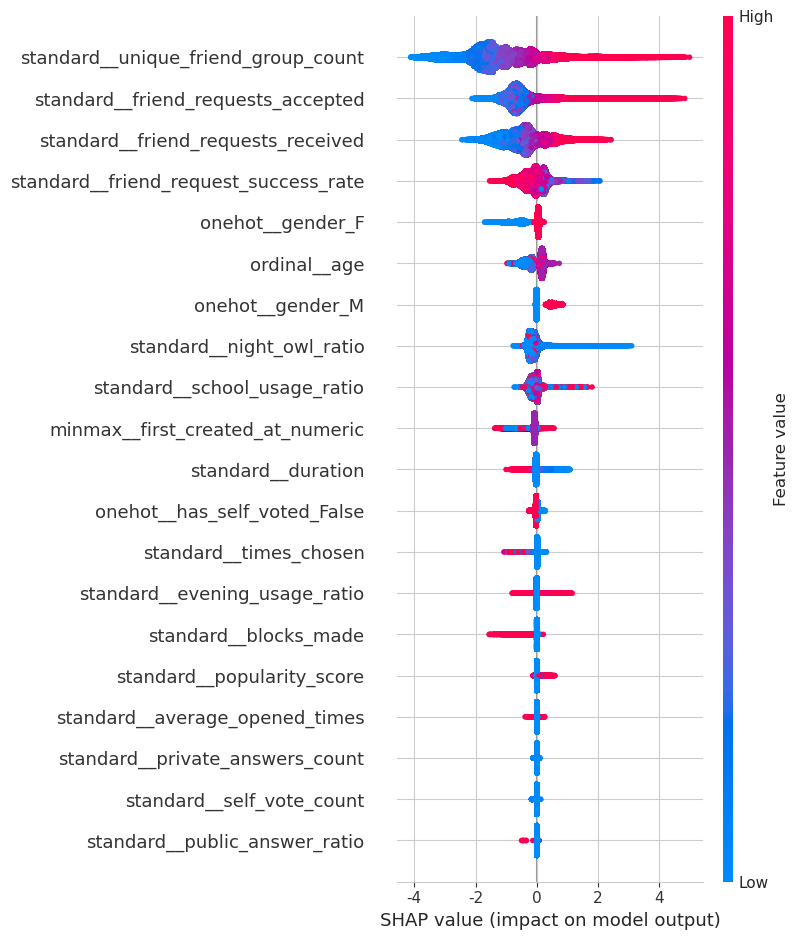

In [18]:
X_train_transformed = pipeline.named_steps['preprocess'].transform(X_train)
feature_names = pipeline.named_steps['preprocess'].get_feature_names_out()

model = pipeline.named_steps['clf']

explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(X_train_transformed)

shap.summary_plot(shap_values, X_train_transformed, feature_names=feature_names)

### 7. LightGBM Classifier

In [24]:
pipeline.set_params(clf=LGBMClassifier(random_state=42))
pipeline.fit(X, y)

[LightGBM] [Info] Number of positive: 606428, number of negative: 606428
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.160119 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 5235
[LightGBM] [Info] Number of data points in the train set: 1212856, number of used features: 27
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000


Pipeline(steps=[('preprocess',
                 ColumnTransformer(transformers=[('standard', StandardScaler(),
                                                  ['duration',
                                                   'friend_requests_received',
                                                   'friend_requests_accepted',
                                                   'friend_request_success_rate',
                                                   'public_answers_count',
                                                   'private_answers_count',
                                                   'public_answer_ratio',
                                                   'night_owl_ratio',
                                                   'school_usage_ratio',
                                                   'evening_usage_ratio',
                                                   'blocks_made',
                                                   'reports_made',
                                                   'sel...
                                                   'times_chosen',
                                                   'average_opened_times',
                                                   'popularity_score',
                                                   'unique_friend_group_count']),
                                                 ('minmax', MinMaxScaler(),
                                                  ['first_created_at_numeric']),
                                                 ('ordinal', OrdinalEncoder(),
                                                  ['age']),
                                                 ('onehot',
                                                  OneHotEncoder(handle_unknown='ignore'),
                                                  ['gender', 'has_self_voted',
                                                   'participated_in_point_event'])])),
                ('smote', SMOTE(random_state=42)),
                ('clf', LGBMClassifier(random_state=42))])

In [25]:
thresholds = np.arange(0.0, 1.0, 0.01)
best_f1 = 0
best_threshold = 0

# 모델 예측 결과는 미리 받아둠
y_proba = pipeline.predict_proba(X_test)[:, 1]

for t in thresholds:
    y_pred_thresh = (y_proba >= t).astype(int)
    score = f1_score(y_test, y_pred_thresh)
    if score > best_f1:
        best_f1 = score
        best_threshold = t

print(f"Best threshold: {best_threshold:.2f}, Best F1-score: {best_f1:.3f}")

Best threshold: 0.53, Best F1-score: 0.599


In [26]:
# threshold 조정
threshold = best_threshold

# 확률 예측 → threshold 적용
y_proba = pipeline.predict_proba(X_test)[:, 1]
y_pred_thresh = (y_proba >= threshold).astype(int)

# 평가 출력
print(f"Threshold: {threshold}")
print(confusion_matrix(y_test, y_pred_thresh))
print(classification_report(y_test, y_pred_thresh))

Threshold: 0.53
[[115579   5707]
 [  5308   8232]]
              precision    recall  f1-score   support

           0       0.96      0.95      0.95    121286
           1       0.59      0.61      0.60     13540

    accuracy                           0.92    134826
   macro avg       0.77      0.78      0.78    134826
weighted avg       0.92      0.92      0.92    134826



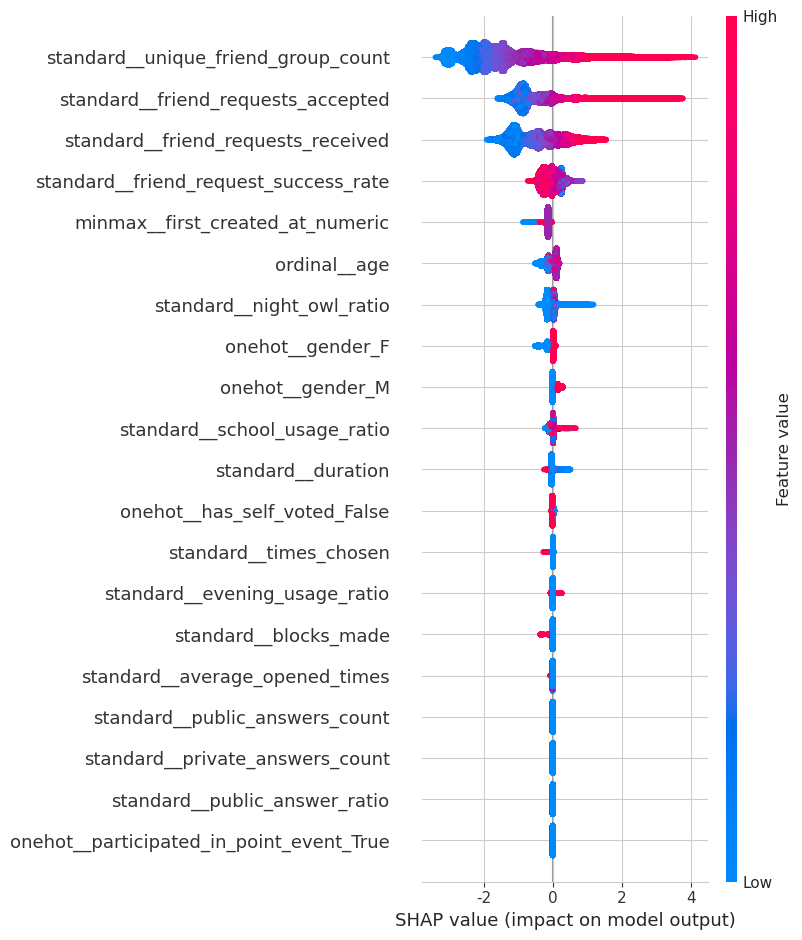

In [27]:
X_train_transformed = pipeline.named_steps['preprocess'].transform(X_train)
feature_names = pipeline.named_steps['preprocess'].get_feature_names_out()

model = pipeline.named_steps['clf']

explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(X_train_transformed)

shap.summary_plot(shap_values, X_train_transformed, feature_names=feature_names)

### 8. CatBoost Classifier

In [28]:
pipeline.set_params(clf=CatBoostClassifier(random_state=42, verbose=0))
pipeline.fit(X, y)

Pipeline(steps=[('preprocess',
                 ColumnTransformer(transformers=[('standard', StandardScaler(),
                                                  ['duration',
                                                   'friend_requests_received',
                                                   'friend_requests_accepted',
                                                   'friend_request_success_rate',
                                                   'public_answers_count',
                                                   'private_answers_count',
                                                   'public_answer_ratio',
                                                   'night_owl_ratio',
                                                   'school_usage_ratio',
                                                   'evening_usage_ratio',
                                                   'blocks_made',
                                                   'reports_made',
                                                   'sel...
                                                   'popularity_score',
                                                   'unique_friend_group_count']),
                                                 ('minmax', MinMaxScaler(),
                                                  ['first_created_at_numeric']),
                                                 ('ordinal', OrdinalEncoder(),
                                                  ['age']),
                                                 ('onehot',
                                                  OneHotEncoder(handle_unknown='ignore'),
                                                  ['gender', 'has_self_voted',
                                                   'participated_in_point_event'])])),
                ('smote', SMOTE(random_state=42)),
                ('clf',
                 <catboost.core.CatBoostClassifier object at 0xffff2da2a110>)])

In [29]:
thresholds = np.arange(0.0, 1.0, 0.01)
best_f1 = 0
best_threshold = 0

# 모델 예측 결과는 미리 받아둠
y_proba = pipeline.predict_proba(X_test)[:, 1]

for t in thresholds:
    y_pred_thresh = (y_proba >= t).astype(int)
    score = f1_score(y_test, y_pred_thresh)
    if score > best_f1:
        best_f1 = score
        best_threshold = t

print(f"Best threshold: {best_threshold:.2f}, Best F1-score: {best_f1:.3f}")

Best threshold: 0.35, Best F1-score: 0.637


In [30]:
# threshold 조정
threshold = best_threshold

# 확률 예측 → threshold 적용
y_proba = pipeline.predict_proba(X_test)[:, 1]
y_pred_thresh = (y_proba >= threshold).astype(int)

# 평가 출력
print(f"Threshold: {threshold}")
print(confusion_matrix(y_test, y_pred_thresh))
print(classification_report(y_test, y_pred_thresh))

Threshold: 0.35000000000000003
[[117232   4054]
 [  5313   8227]]
              precision    recall  f1-score   support

           0       0.96      0.97      0.96    121286
           1       0.67      0.61      0.64     13540

    accuracy                           0.93    134826
   macro avg       0.81      0.79      0.80    134826
weighted avg       0.93      0.93      0.93    134826



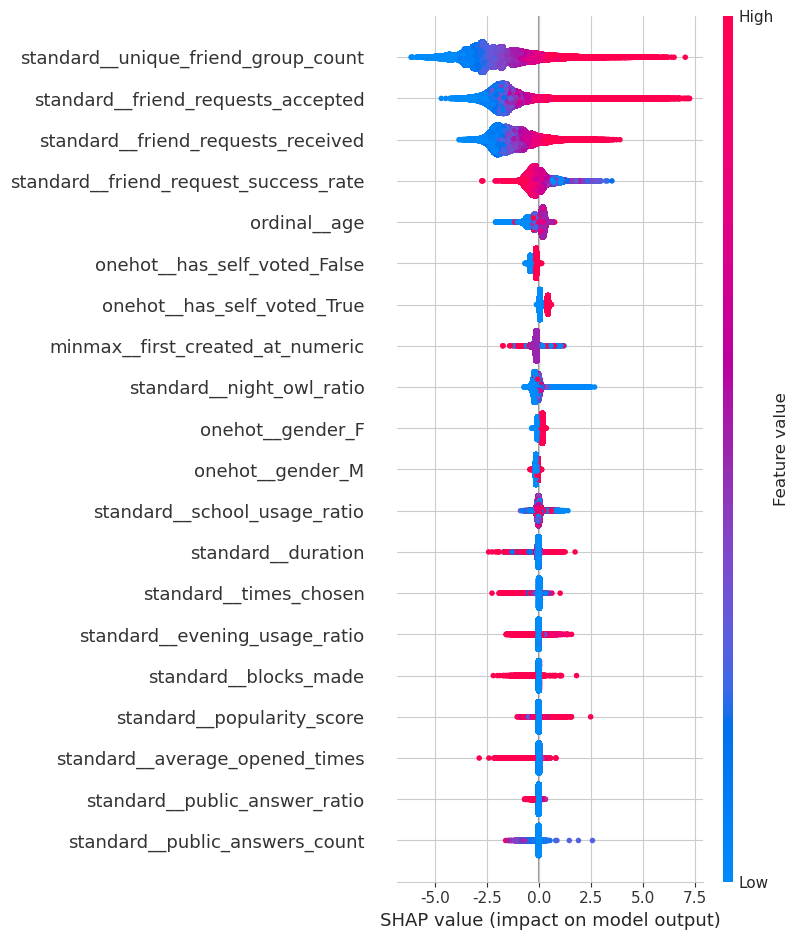

In [31]:
X_train_transformed = pipeline.named_steps['preprocess'].transform(X_train)
feature_names = pipeline.named_steps['preprocess'].get_feature_names_out()

model = pipeline.named_steps['clf']

explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(X_train_transformed)

shap.summary_plot(shap_values, X_train_transformed, feature_names=feature_names)

### 9. RandomForest Classifier

In [32]:
pipeline.set_params(clf=RandomForestClassifier(random_state=42))
pipeline.fit(X, y)

Pipeline(steps=[('preprocess',
                 ColumnTransformer(transformers=[('standard', StandardScaler(),
                                                  ['duration',
                                                   'friend_requests_received',
                                                   'friend_requests_accepted',
                                                   'friend_request_success_rate',
                                                   'public_answers_count',
                                                   'private_answers_count',
                                                   'public_answer_ratio',
                                                   'night_owl_ratio',
                                                   'school_usage_ratio',
                                                   'evening_usage_ratio',
                                                   'blocks_made',
                                                   'reports_made',
                                                   'sel...
                                                   'average_opened_times',
                                                   'popularity_score',
                                                   'unique_friend_group_count']),
                                                 ('minmax', MinMaxScaler(),
                                                  ['first_created_at_numeric']),
                                                 ('ordinal', OrdinalEncoder(),
                                                  ['age']),
                                                 ('onehot',
                                                  OneHotEncoder(handle_unknown='ignore'),
                                                  ['gender', 'has_self_voted',
                                                   'participated_in_point_event'])])),
                ('smote', SMOTE(random_state=42)),
                ('clf', RandomForestClassifier(random_state=42))])

In [33]:
thresholds = np.arange(0.0, 1.0, 0.01)
best_f1 = 0
best_threshold = 0

# 모델 예측 결과는 미리 받아둠
y_proba = pipeline.predict_proba(X_test)[:, 1]

for t in thresholds:
    y_pred_thresh = (y_proba >= t).astype(int)
    score = f1_score(y_test, y_pred_thresh)
    if score > best_f1:
        best_f1 = score
        best_threshold = t

print(f"Best threshold: {best_threshold:.2f}, Best F1-score: {best_f1:.3f}")

Best threshold: 0.47, Best F1-score: 0.999


In [34]:
# threshold 조정
threshold = best_threshold

# 확률 예측 → threshold 적용
y_proba = pipeline.predict_proba(X_test)[:, 1]
y_pred_thresh = (y_proba >= threshold).astype(int)

# 평가 출력
print(f"Threshold: {threshold}")
print(confusion_matrix(y_test, y_pred_thresh))
print(classification_report(y_test, y_pred_thresh))

Threshold: 0.47000000000000003
[[121278      8]
 [    10  13530]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    121286
           1       1.00      1.00      1.00     13540

    accuracy                           1.00    134826
   macro avg       1.00      1.00      1.00    134826
weighted avg       1.00      1.00      1.00    134826



### 10. Classifier SHAP Analysis

In [ ]:
# SHAP 분석을 위해 전처리 후 데이터 추출
X_train_transformed = pipeline.named_steps['preprocess'].transform(X_train)
feature_names = pipeline.named_steps['preprocess'].get_feature_names_out()

# XGBoost 모델만 따로 가져옴
model = pipeline.named_steps['clf']

# SHAP explainer 생성
explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(X_train_transformed)

# 요약 플롯 출력
shap.summary_plot(shap_values, X_train_transformed, feature_names=feature_names)

In [ ]:
# SHAP 값 분포 히트맵 (전체 영향력 파악)

# SHAP 값을 DataFrame으로 변환
shap_df = pd.DataFrame(shap_values, columns=feature_names)

# 상위 영향력을 가진 변수만 추출
top_features = shap_df.abs().mean().sort_values(ascending=False).head(10).index

# 히트맵으로 시각화
plt.figure(figsize=(12, 6))
sns.heatmap(shap_df[top_features].abs(), cmap='viridis', cbar=True)
plt.title("SHAP value heatmap for top 10 features")
plt.show()

# SHAP Dependence Plot (특정 feature가 예측에 어떤 영향을 주는지)

# 가장 중요한 feature 하나 선택해서
important_feat = top_features[0]  # 예: 'standard__duration'

# SHAP dependence plot
shap.dependence_plot(important_feat, shap_values, X_train_transformed, feature_names=feature_names)

# SHAP force plot (개별 예측 설명)

# 하나의 샘플을 선택 (예: 첫 번째 샘플)
sample_idx = 0
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values[sample_idx], X_train_transformed[sample_idx], feature_names=feature_names)

# Feature Importance Bar Plot (전체 평균 SHAP 기준)

importances = np.abs(shap_values).mean(axis=0)
importance_df = pd.DataFrame({'feature': feature_names, 'importance': importances})
importance_df = importance_df.sort_values(by='importance', ascending=False)

# 막대그래프 출력
plt.figure(figsize=(10, 6))
sns.barplot(data=importance_df.head(10), x='importance', y='feature')
plt.title("Mean SHAP Value (Top 10 Features)")
plt.xlabel("Mean |SHAP value|")
plt.ylabel("Feature")
plt.show()

### 11. Prediction Model

In [4]:
user_feature_final = pd.read_csv('/home/jovyan/work/data/user_feature_final.csv')
user_zindex_merge = pd.read_parquet('/home/jovyan/work/data/user_index_labeling.parquet')

/tmp/ipykernel_50660/2923740145.py:1: DtypeWarning: Columns (23) have mixed types. Specify dtype option on import or set low_memory=False.
  user_feature_final = pd.read_csv('/home/jovyan/work/data/user_feature_final.csv')


In [5]:
user_feature_final_merge = pd.merge(user_feature_final, user_zindex_merge[['node', 'z_total', 'label']], left_on='user_id', right_on='node')

In [6]:
user_feature_final_merge.columns

Index(['user_id', 'duration', 'gender', 'degree', 'betweenness', 'pagerank',
       'closeness', 'label_x', 'age', 'first_created_at_numeric',
       'friend_requests_received', 'friend_requests_accepted',
       'friend_request_success_rate', 'public_answers_count',
       'private_answers_count', 'public_answer_ratio', 'night_owl_ratio',
       'school_usage_ratio', 'evening_usage_ratio', 'blocks_made',
       'reports_made', 'self_vote_count', 'self_vote_ratio', 'has_self_voted',
       'participation_count', 'participated_in_point_event', 'times_chosen',
       'average_opened_times', 'popularity_score', 'unique_friend_group_count',
       'node', 'z_total', 'label_y'],
      dtype='object')

In [6]:
y_reg = user_feature_final_merge['z_total']
X_reg = user_feature_final_merge.drop(columns=['user_id', 'degree', 'betweenness', 'pagerank', 'closeness', 'z_total', 'node', 'label_x', 'label_y'])

In [7]:
X_reg['participated_in_point_event'] = X_reg['participated_in_point_event'].astype(bool)
X_reg['has_self_voted'] = X_reg['has_self_voted'].astype(bool)

In [8]:
# 전처리
preprocessor = ColumnTransformer(transformers=[
    ('standard', StandardScaler(), ['duration', 'friend_requests_received', 'friend_requests_accepted', 'friend_request_success_rate',
                                    'public_answers_count', 'private_answers_count', 'public_answer_ratio',
                                    'night_owl_ratio', 'school_usage_ratio', 'evening_usage_ratio',
                                    'blocks_made', 'reports_made', 'self_vote_count', 'self_vote_ratio',
                                    'participation_count', 'times_chosen',
                                    'average_opened_times', 'popularity_score', 'unique_friend_group_count']),
    ('minmax', MinMaxScaler(), ['first_created_at_numeric']),
    ('ordinal', OrdinalEncoder(), ['age']),
    ('onehot', OneHotEncoder(handle_unknown='ignore'), ['gender', 'has_self_voted', 'participated_in_point_event'])
])

In [10]:
from xgboost import XGBRegressor
from sklearn.metrics import mean_squared_error, r2_score

# 회귀용 파이프라인 (이전과 거의 동일)
reg_pipeline = Pipeline(steps=[
    ('preprocess', preprocessor),  # 이전에 정의한 ColumnTransformer 재사용
    ('regressor', XGBRegressor(random_state=42))
])

# 학습/테스트 분할
X_train, X_test, y_train, y_test = train_test_split(X_reg, y_reg, test_size=0.2, random_state=42)

# 학습
reg_pipeline.fit(X_train, y_train)

# 예측
y_pred = reg_pipeline.predict(X_test)

# 평가
print("MSE:", mean_squared_error(y_test, y_pred))
print("R2:", r2_score(y_test, y_pred))

MSE: 0.15183198007337784
R2: 0.6188930518160518


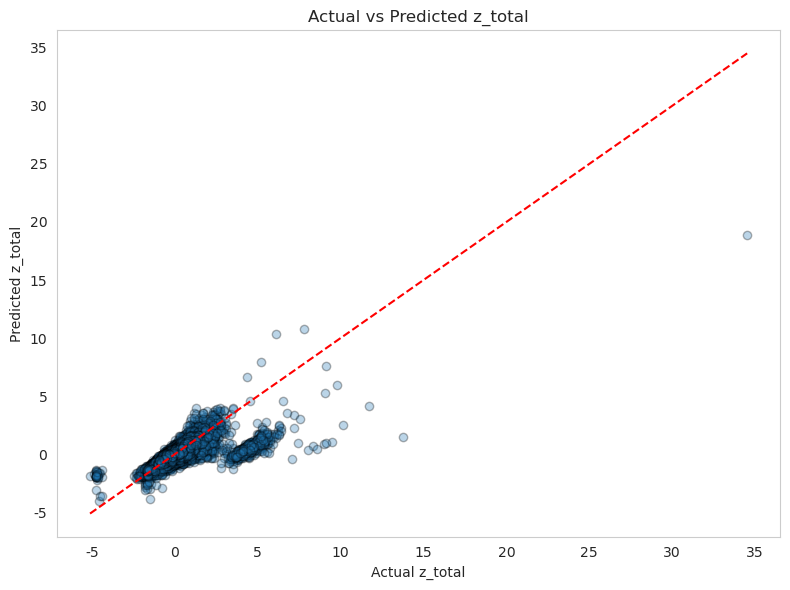

In [11]:
plt.figure(figsize=(8, 6))
plt.scatter(y_test, y_pred, alpha=0.3, edgecolor='k')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--')  # y=x 기준선
plt.xlabel("Actual z_total")
plt.ylabel("Predicted z_total")
plt.title("Actual vs Predicted z_total")
plt.grid()
plt.tight_layout()
plt.show()

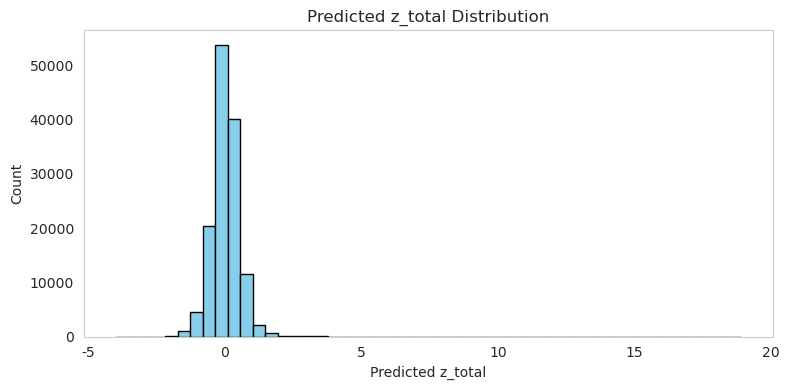

In [12]:
plt.figure(figsize=(8, 4))
plt.hist(y_pred, bins=50, color='skyblue', edgecolor='black')
plt.title("Predicted z_total Distribution")
plt.xlabel("Predicted z_total")
plt.ylabel("Count")
plt.grid()
plt.tight_layout()
plt.show()

In [ ]:
import shap

# 1. 전처리된 학습 데이터 얻기
X_train_transformed = reg_pipeline.named_steps['preprocess'].transform(X_train)
feature_names = reg_pipeline.named_steps['preprocess'].get_feature_names_out()

# 2. 모델 추출
reg_model = reg_pipeline.named_steps['regressor']

# 3. SHAP explainer 생성 및 계산
explainer = shap.TreeExplainer(reg_model)
shap_values = explainer.shap_values(X_train_transformed)

# 4. 요약 그래프
shap.summary_plot(shap_values, X_train_transformed, feature_names=feature_names)

#### 상위 1% 클리핑

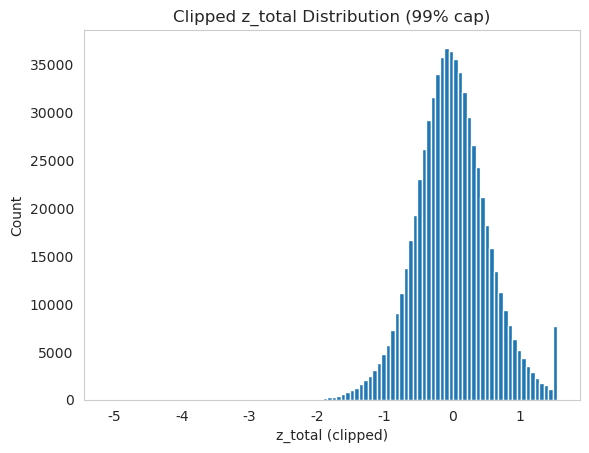

In [9]:
# z_total 상위 1% 기준값 계산
clip_threshold = y_reg.quantile(0.99)

# 클리핑 적용
y_clipped = y_reg.clip(upper=clip_threshold)

# 분포 확인 (선택)
import matplotlib.pyplot as plt
plt.hist(y_clipped, bins=100)
plt.title("Clipped z_total Distribution (99% cap)")
plt.xlabel("z_total (clipped)")
plt.ylabel("Count")
plt.grid()
plt.show()

In [10]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score
from xgboost import XGBRegressor

# 데이터 분할
X_train, X_test, y_train, y_test = train_test_split(X_reg, y_clipped, test_size=0.2, random_state=42)

# 기존 전처리 preprocessor 사용
reg_pipeline = Pipeline(steps=[
    ('preprocess', preprocessor),
    ('regressor', XGBRegressor(random_state=42))
])

# 학습
reg_pipeline.fit(X_train, y_train)

# 예측 및 평가
y_pred = reg_pipeline.predict(X_test)
print("MSE:", mean_squared_error(y_test, y_pred))
print("R2:", r2_score(y_test, y_pred))

MSE: 0.08280322354687208
R2: 0.7236778787601976


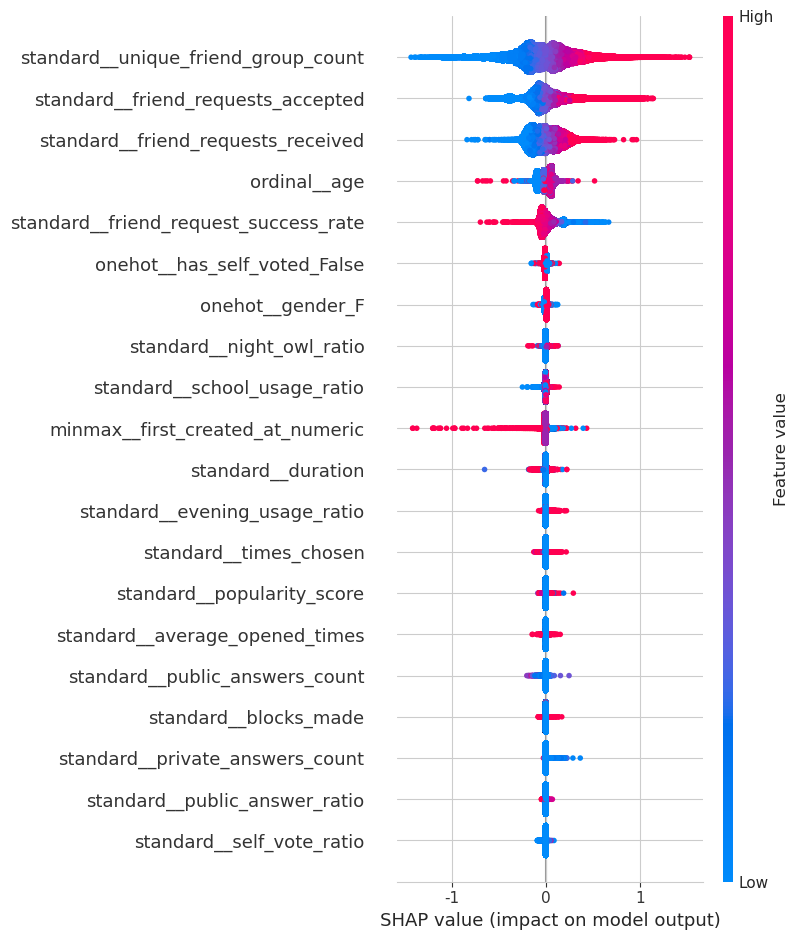

In [9]:
import shap

# 전처리된 X 얻기
X_train_transformed = reg_pipeline.named_steps['preprocess'].transform(X_train)
feature_names = reg_pipeline.named_steps['preprocess'].get_feature_names_out()

# 모델 불러오기
reg_model = reg_pipeline.named_steps['regressor']

# SHAP 계산
explainer = shap.TreeExplainer(reg_model)
shap_values = explainer.shap_values(X_train_transformed)

# Summary plot 출력
shap.summary_plot(shap_values, X_train_transformed, feature_names=feature_names)

#### 클리핑 + 모델 비교

In [ ]:
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.svm import SVR
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.pipeline import Pipeline
import pandas as pd
import time

# 모델 정의
models = {
    'XGBRegressor': XGBRegressor(random_state=42),
    'LinearRegression': LinearRegression(),
    'Ridge': Ridge(),
    'Lasso': Lasso(),
    'RandomForest': RandomForestRegressor(n_jobs=-1, random_state=42),
    'GradientBoosting': GradientBoostingRegressor(random_state=42),
    'SVR': SVR()
}

# 사전 전처리 캐싱
X_train_processed = preprocessor.fit_transform(X_train)
X_test_processed = preprocessor.transform(X_test)

# 결과 저장
results = []

print(f"총 모델 수: {len(models)}개\n")

for i, (name, model) in enumerate(models.items(), 1):
    print(f"[{i}/{len(models)}] {name} 학습 시작...")

    start_fit = time.time()
    model.fit(X_train_processed, y_train)
    end_fit = time.time()
    print(f" - 학습 완료 (소요 시간: {round(end_fit - start_fit, 2)}초)")

    start_pred = time.time()
    y_pred = model.predict(X_test_processed)
    end_pred = time.time()
    print(f" - 예측 완료 (소요 시간: {round(end_pred - start_pred, 2)}초)")

    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)

    print(f"✅ {name} 결과: MSE={round(mse, 4)}, R2={round(r2, 4)}\n")

    results.append({
        'Model': name,
        'MSE': round(mse, 4),
        'R2': round(r2, 4),
        'FitTime(s)': round(end_fit - start_fit, 2),
        'PredictTime(s)': round(end_pred - start_pred, 2)
    })

총 모델 수: 7개

[1/7] XGBRegressor 학습 시작...
 - 학습 완료 (소요 시간: 5.43초)
 - 예측 완료 (소요 시간: 0.09초)
✅ XGBRegressor 결과: MSE=0.0828, R2=0.7237

[2/7] LinearRegression 학습 시작...
 - 학습 완료 (소요 시간: 0.67초)
 - 예측 완료 (소요 시간: 0.0초)
✅ LinearRegression 결과: MSE=0.1055, R2=0.6478

[3/7] Ridge 학습 시작...
 - 학습 완료 (소요 시간: 0.12초)
 - 예측 완료 (소요 시간: 0.0초)
✅ Ridge 결과: MSE=0.1055, R2=0.6478

[4/7] Lasso 학습 시작...
 - 학습 완료 (소요 시간: 0.16초)
 - 예측 완료 (소요 시간: 0.0초)
✅ Lasso 결과: MSE=0.2997, R2=-0.0001

[5/7] RandomForest 학습 시작...
 - 학습 완료 (소요 시간: 139.14초)
 - 예측 완료 (소요 시간: 4.38초)
✅ RandomForest 결과: MSE=0.0893, R2=0.7019

[6/7] GradientBoosting 학습 시작...
 - 학습 완료 (소요 시간: 95.99초)
 - 예측 완료 (소요 시간: 0.28초)
✅ GradientBoosting 결과: MSE=0.0853, R2=0.7152

[7/7] SVR 학습 시작...
